# Loading and working with processed fetal Visium data

In [1]:
import numpy as np
import scipy as sp
import scanpy as sc
import pandas as pd
import pickle as pkl
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import re
import os
import scipy.stats
from numpy import asarray as ar
from collections import Counter
import scvi

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all" # to show output from all the lines in a cells
pd.set_option('display.max_column',None) # display all the columns in pandas
pd.options.display.max_rows = 100

from datetime import date
today = str(date.today())
sc.settings.verbosity = 1
sc.logging.print_version_and_date()
%load_ext autoreload
%autoreload 2

Global seed set to 0


Running Scanpy 1.9.1, on 2023-07-08 20:46.


In [2]:
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

In [3]:
## For correct plotting of the images
import matplotlib
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42

In [4]:
import os
os.getcwd()

'/nfs/team205/ny1/ThymusSpatialAtlas/Figure2'

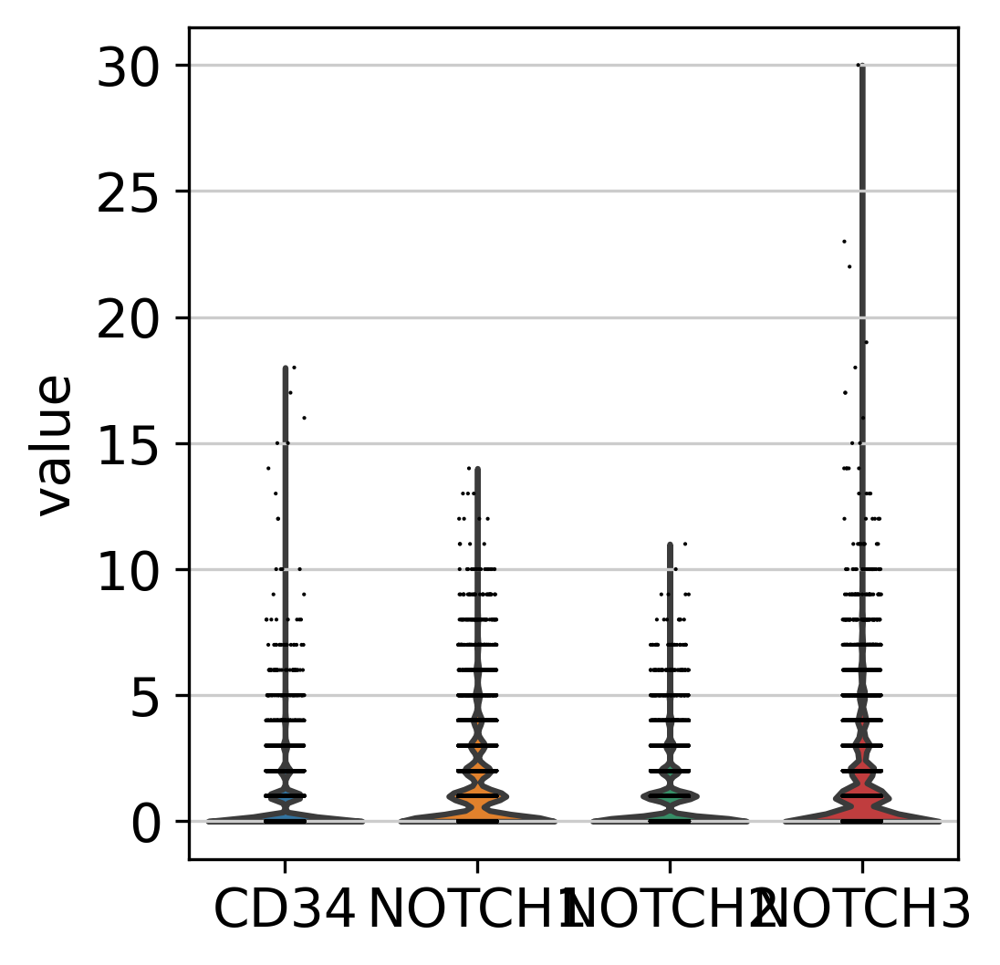

In [5]:
# adata_fet = sc.read("/nfs/team205/vk8/projects/thymus_atlas/results/thymus_atlas_v2_anno_v4_fetal/cell2location_map/sp.h5ad")
adata_fet = sc.read("/nfs/team205/vk8/projects/thymus_atlas/results/thymus_atlas_v2_anno_v9_fetal_sub_annov3/cell2location_map/sp.h5ad")
list = ['CD34','NOTCH1','NOTCH2','NOTCH3']
sc.pl.violin(adata_fet, keys =list)

In [6]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present', 
# to adata.obs with nice names for plotting
adata_fet.obs[adata_fet.uns['mod']['factor_names']] = adata_fet.obsm['q05_cell_abundance_w_sf']

In [7]:
adata_fet.obs['tot_cell_abundance'] = adata_fet.uns["mod"]["post_sample_means"]["w_sf"].sum(1).flatten()
adata_fet.obs['detection_sensit']  = adata_fet.uns["mod"]["post_sample_q05"]["detection_y_s"]

In [8]:
# np.mean(adata_fet.obs['tot_cell_abundance']>20)
np.mean(adata_fet.obs['tot_cell_abundance']>25)
# adata_fet.uns["mod"]


0.8778147977941176

In [9]:
# filter spots by coverage
adata_fet_filt = adata_fet[adata_fet.obs['tot_cell_abundance']>30,:].copy()
adata_fet_filt = adata_fet_filt[adata_fet_filt.obs['n_genes_by_counts']>1000,:]

adata_fet_filt

View of AnnData object with n_obs × n_vars = 13508 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 'Cortico_Medullar_Axis', 'SampleID', 'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 'L2_dist_log10_Annotation_lv_1_Large vessel', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min

# embed new annotations 

In [10]:
# remove outdated annotations 
annotations_to_remove = ['L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 
                         'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 
                         'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 
                         'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 
                         'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 
                         'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 
                         'L2_dist_log10_Annotation_lv_1_Large vessel']

adata_fet_filt.obs.drop(columns=annotations_to_remove, errors='ignore', inplace=True)
adata_fet_filt.obs.rename(columns={'Cortico_Medullar_Axis': 'cma_v1'}, inplace=True)

adata_fet_filt

AnnData object with n_obs × n_vars = 13508 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cma_v1', 'SampleID', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN/DV200', 'Spatial_type', 'DonorID', 'Donor_type', 'Age_group', 'Age(misc)', 'Age(numeric)', 'Source', 'Sex', 'QC', 'Batch', 'CMA version ', 'Spaceranger', 'Comments', 'Medians Genes per Spot (>1500)', 'Mean Reads per spot ', 'Median UMI per spot ', 'Usefull region out of tissue (>30%)', 'Tissue Morphology ', 'Spots under tissue', 'Fraction of reads in tissue', 'Sample Rank', 'original_image_name', 'old_sample_name', 'annotation_type', 'uploaded_annotated', 'annotated_path', '_indices', '_scvi_batch', '_scvi_labels', 'B(P)', 'B(Q)', 'B-pro/pre', 'DC-a1', 'DC-a3', 'DC1', 'DC2', 'EC-Art

In [11]:


# load the CSV file into a dataframe
df = pd.read_csv('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/HTSA_All_Spatial_Data_v3 - visium.csv')

# load the large anndata object
large_adata = adata_fet_filt.copy()

# iterate over the dataframe rows
for index, row in df.iterrows():
    # load the anndata object from the path
    adata = sc.read_h5ad(row['path']+'/adata_cma_v2.h5ad')
    dtypes = adata.obs.dtypes
    # prepend SampleID to cell barcodes
    adata.obs_names = row['SampleID'] + '-' + adata.obs_names
    
    # calculate the number of matching cells
    matching_cells = large_adata.obs.index.intersection(adata.obs.index)
    matching_cells_num = matching_cells.shape[0]
    total_cells = adata.n_obs
    print(f"Number of matching cells for {row['path']}: {matching_cells_num} out of {total_cells}")

    # update the annotations for the cells
    for col in adata.obs.columns:
        if col not in large_adata.obs.columns:
            # if the column doesn't exist in the large anndata object, add it
            large_adata.obs[col] = pd.Series(data=np.nan, index=large_adata.obs.index)
        # if the column exists in the large anndata object, update the relevant cells
        if str(dtypes[col]) == 'category':
            large_adata.obs[col] = large_adata.obs[col].astype('object') 
            large_adata.obs.loc[matching_cells, col] = adata.obs.loc[matching_cells, col]
            large_adata.obs[col] = large_adata.obs[col].astype('category') 
        else:
            large_adata.obs.loc[matching_cells, col] = adata.obs.loc[matching_cells, col]

adata_fet_filt = large_adata


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486161: 0 out of 4963


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486162: 0 out of 4991


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486163: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11486164: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556492: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556493: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556494: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556495: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/TA11556496: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp10864183: 1321 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604685: 820 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604686: 1178 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604687: 805 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604688: 714 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604689: 311 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11604690: 316 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11765867: 1569 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11765868: 1751 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp11765870: 1796 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp9838711: 1345 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_F_IMMsp9838716: 1582 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142086: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142087: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142088: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9142089: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9518030: 0 out of 4992
Number of matching cells for /nfs/team205/vk8/irods_data/09_thymus/visium/all_thymus_visium/raw_data2/Align_and_detect_output/hsta/WSSS_THYst9518032: 0 out of 4992


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [12]:
adata_fet_filt

AnnData object with n_obs × n_vars = 13508 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cma_v1', 'SampleID', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN/DV200', 'Spatial_type', 'DonorID', 'Donor_type', 'Age_group', 'Age(misc)', 'Age(numeric)', 'Source', 'Sex', 'QC', 'Batch', 'CMA version ', 'Spaceranger', 'Comments', 'Medians Genes per Spot (>1500)', 'Mean Reads per spot ', 'Median UMI per spot ', 'Usefull region out of tissue (>30%)', 'Tissue Morphology ', 'Spots under tissue', 'Fraction of reads in tissue', 'Sample Rank', 'original_image_name', 'old_sample_name', 'annotation_type', 'uploaded_annotated', 'annotated_path', '_indices', '_scvi_batch', '_scvi_labels', 'B(P)', 'B(Q)', 'B-pro/pre', 'DC-a1', 'DC-a3', 'DC1', 'DC2', 'EC-Art

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


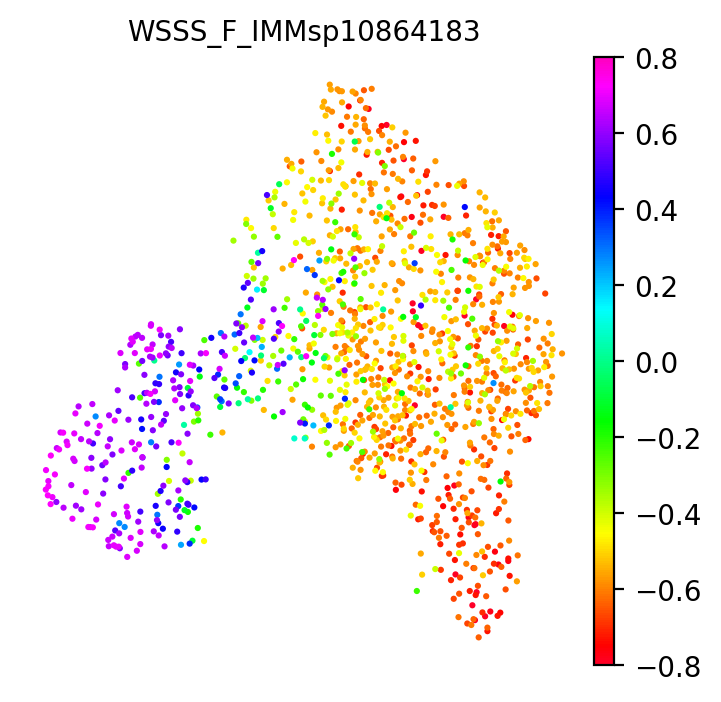

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


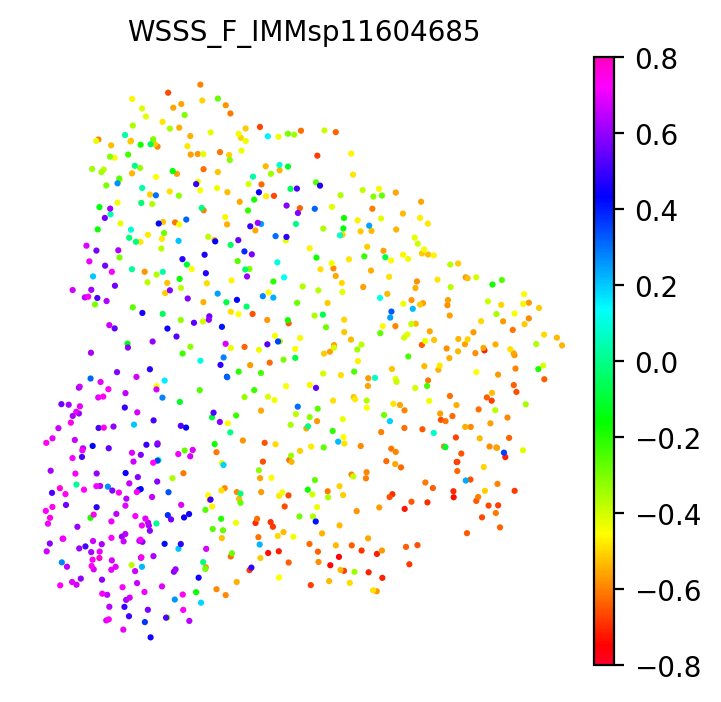

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


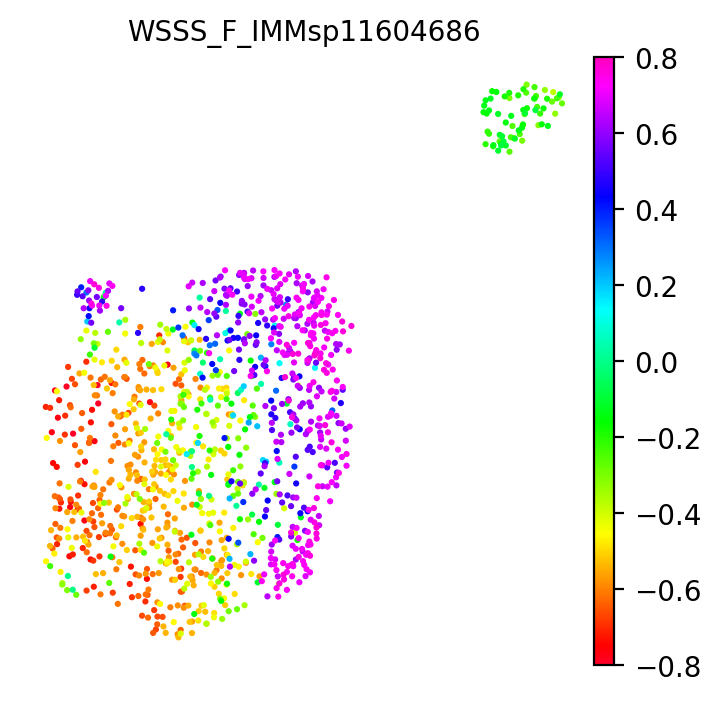

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


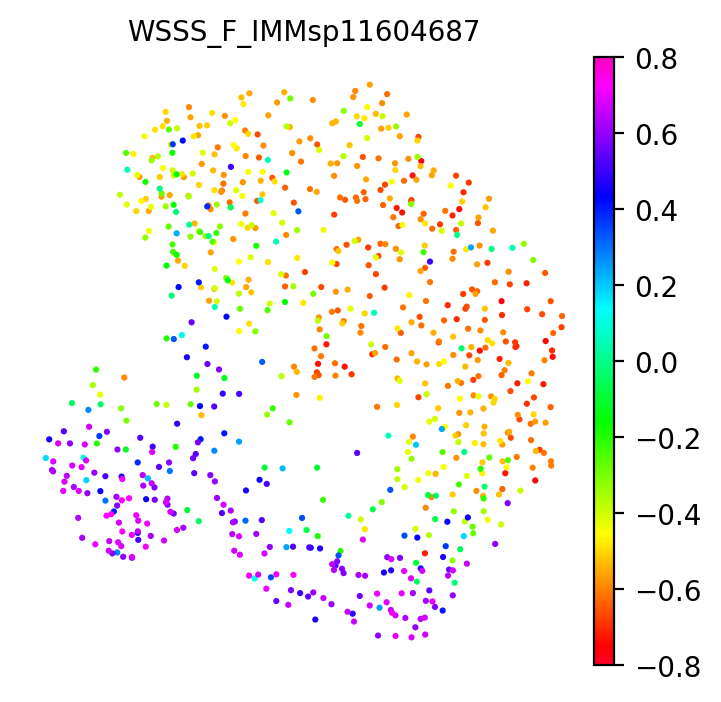

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


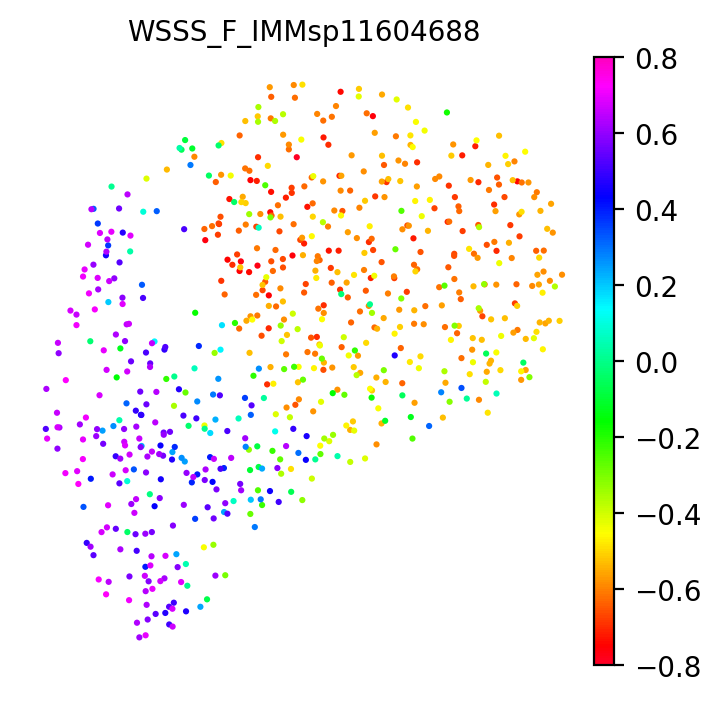

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


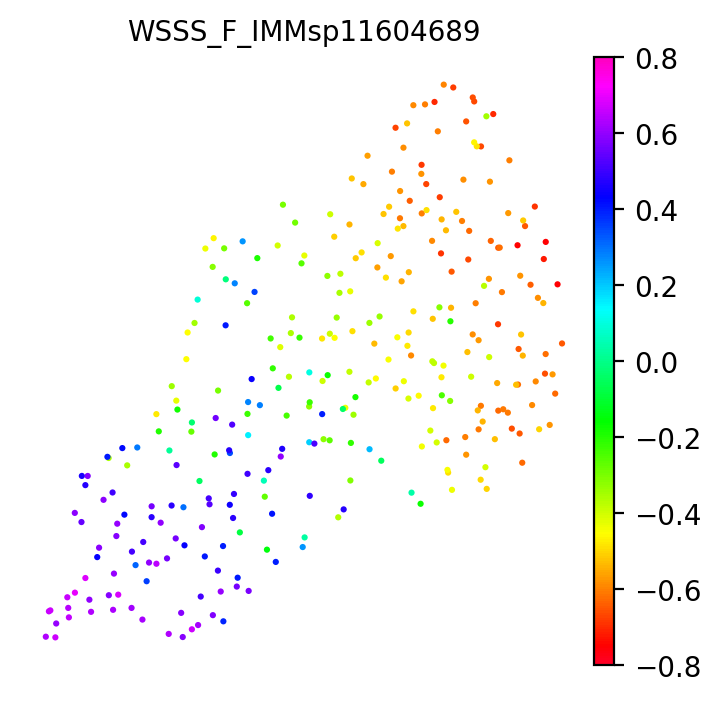

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


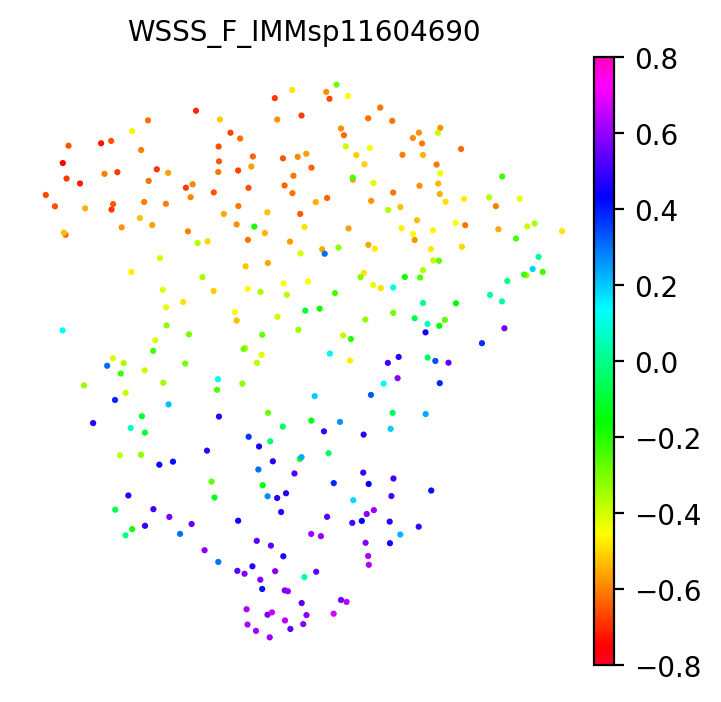

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


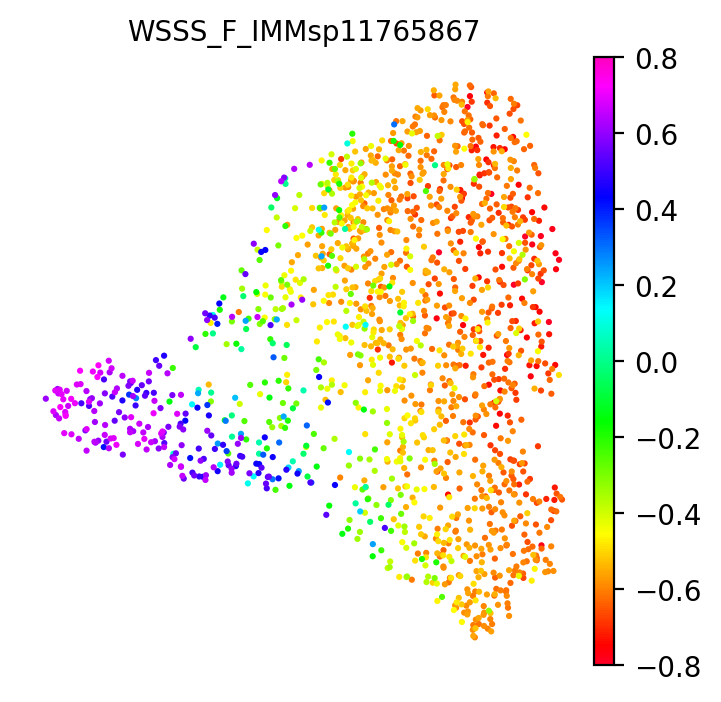

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


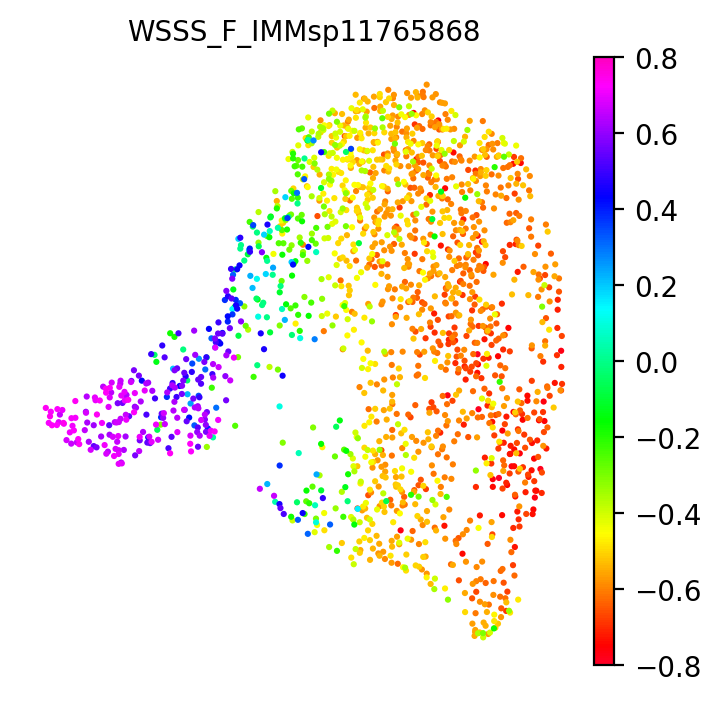

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


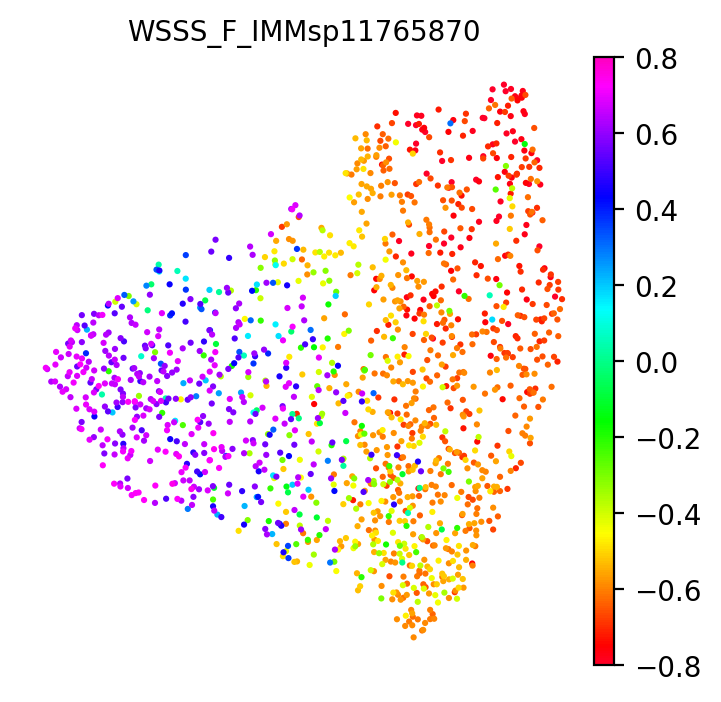

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


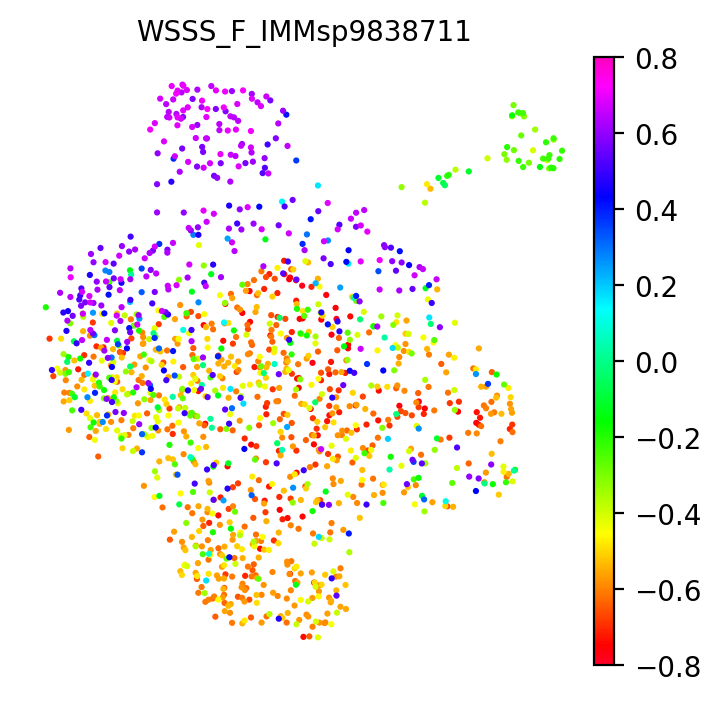

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


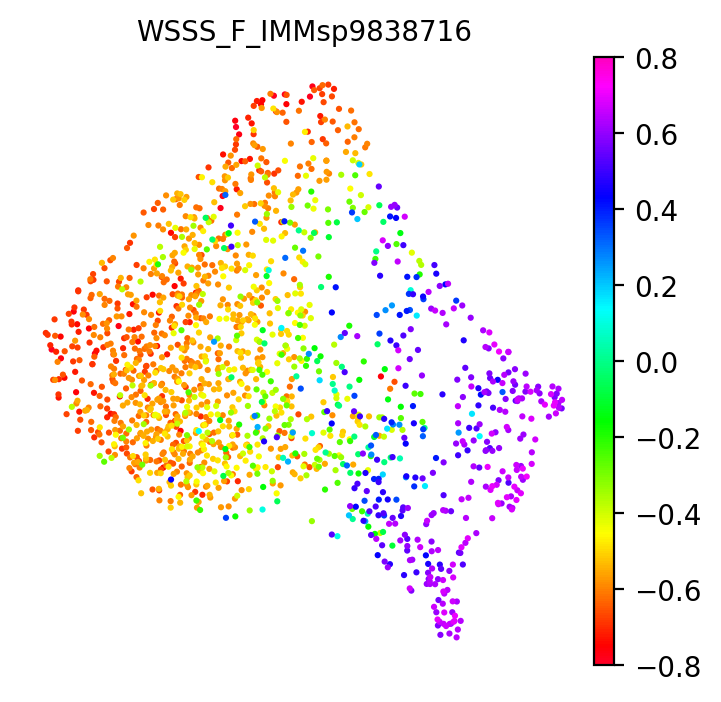

In [16]:
sc.set_figure_params(figsize=[4,4],fontsize=10,dpi=100)

for s in np.unique(adata_fet_filt.obs['SampleID']):
    adata = adata_fet_filt[adata_fet_filt.obs['SampleID']==s].copy()
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.pl.umap(adata, color = ['cma_v2']
           , title = s, frameon = False, cmap = 'gist_rainbow',save='_paed_sample_id'+s+'.pdf',s=20,vmin=-0.8,vmax=0.8)


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


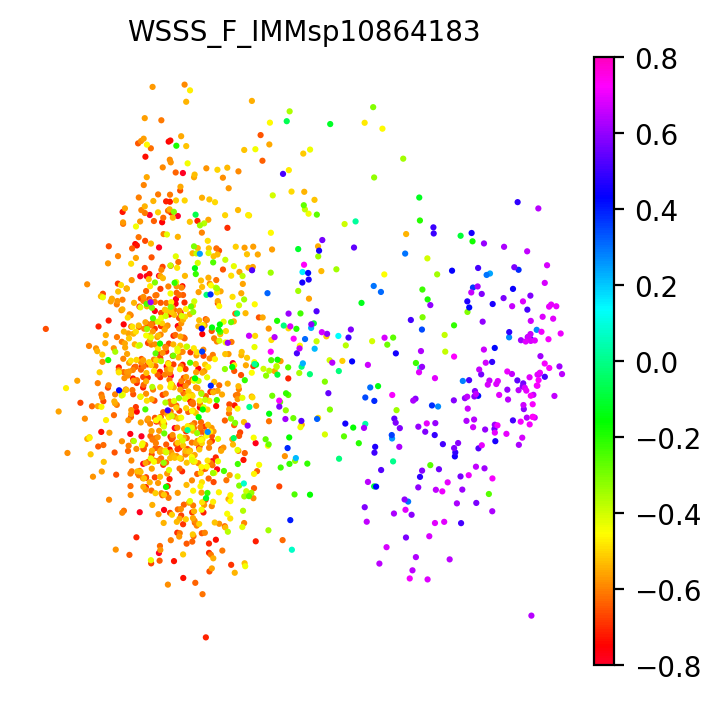

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


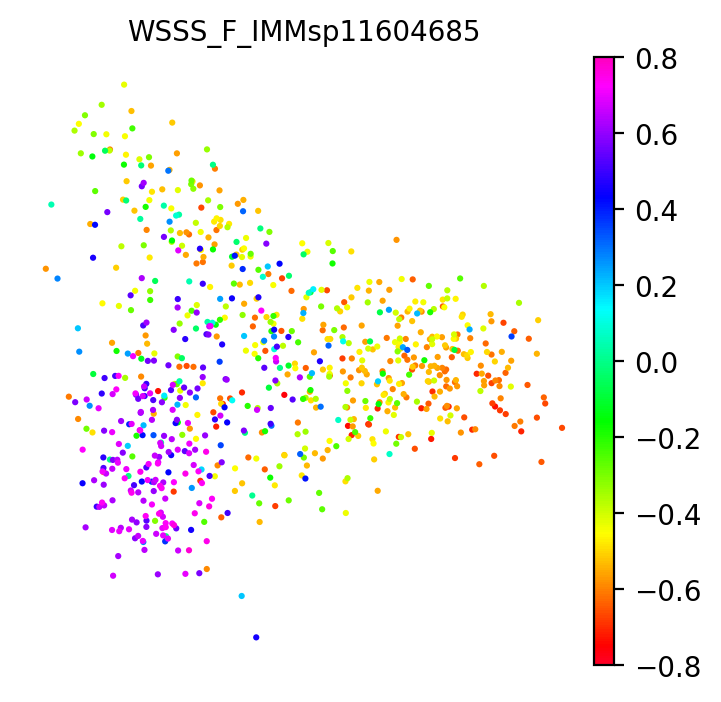

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


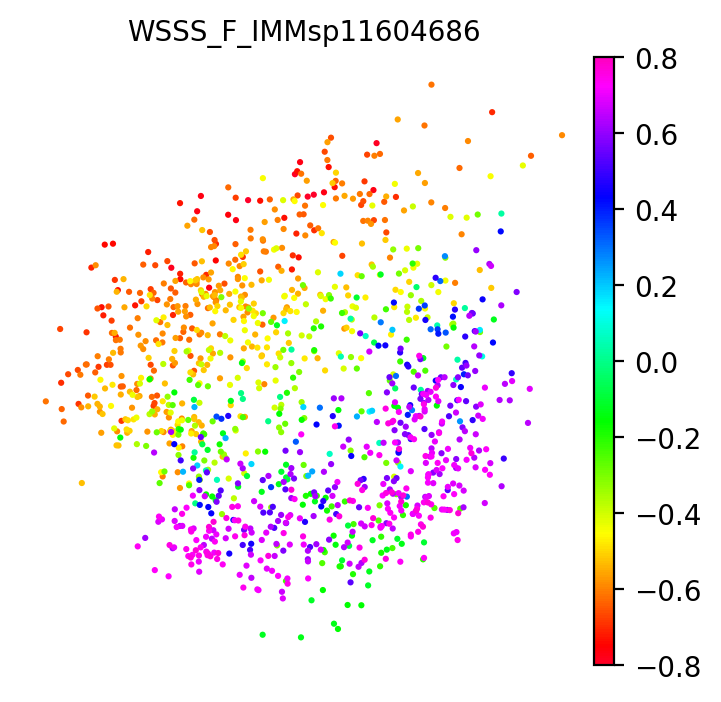

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


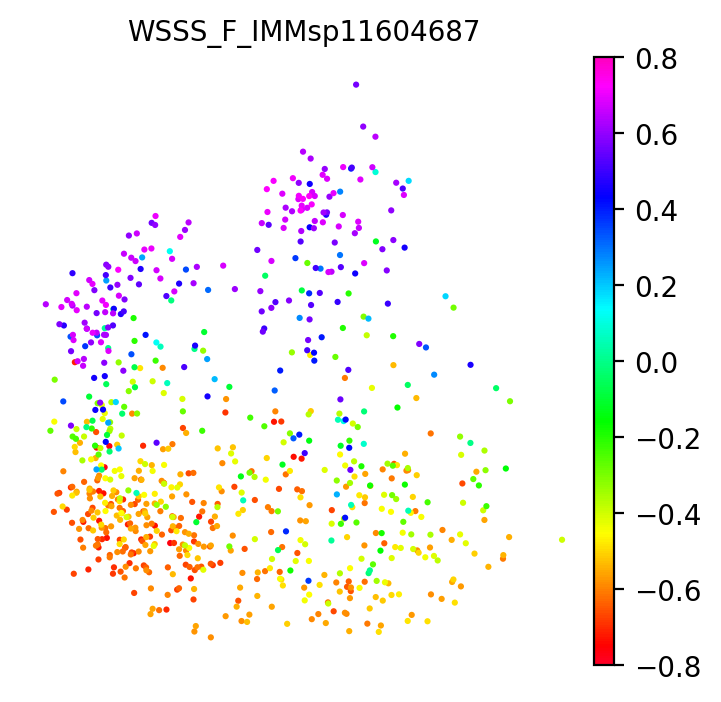

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


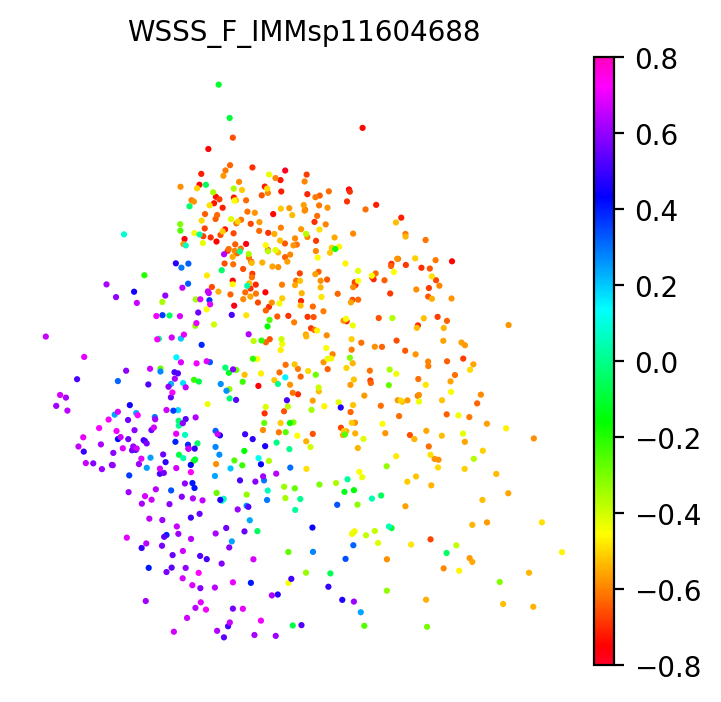

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


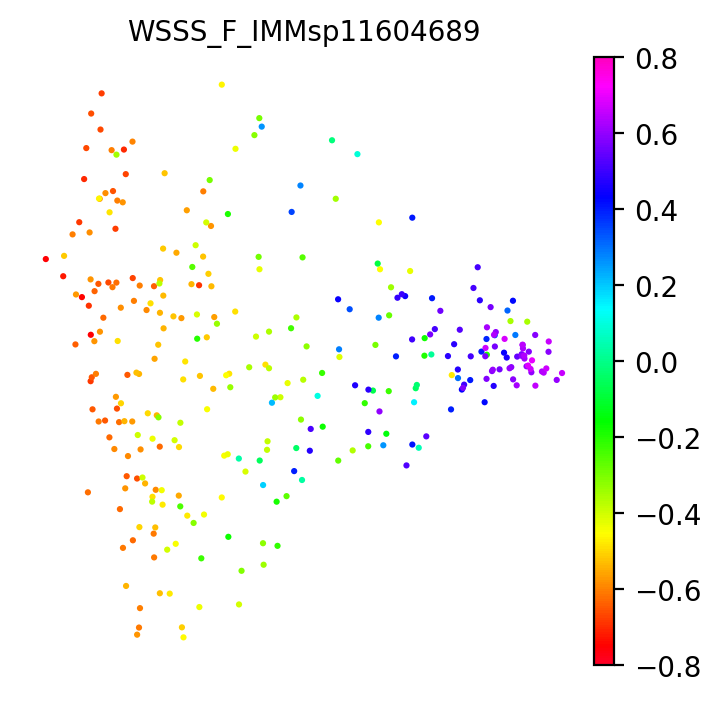

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


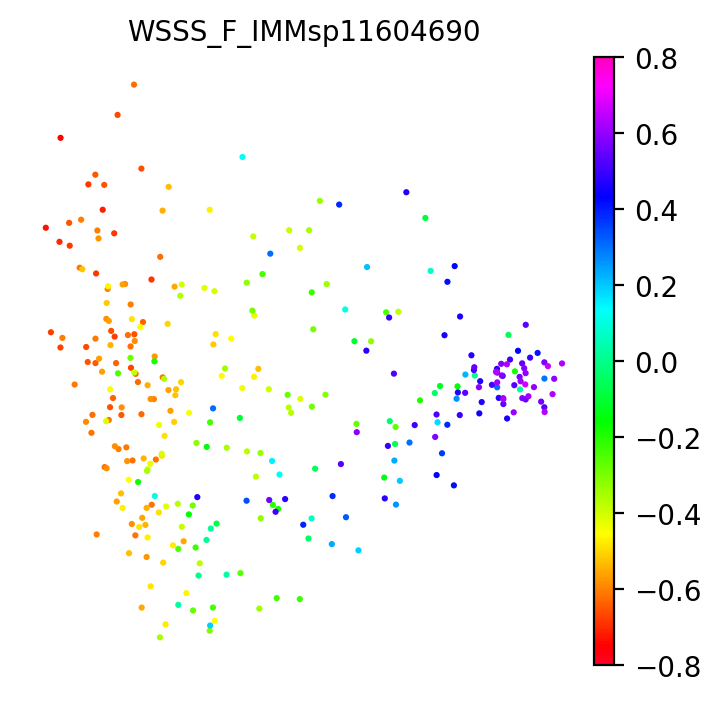

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


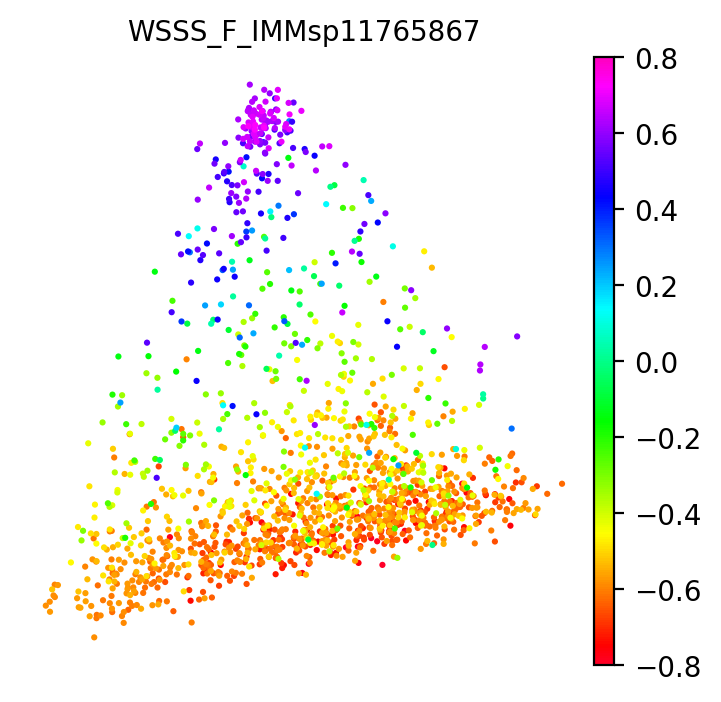

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


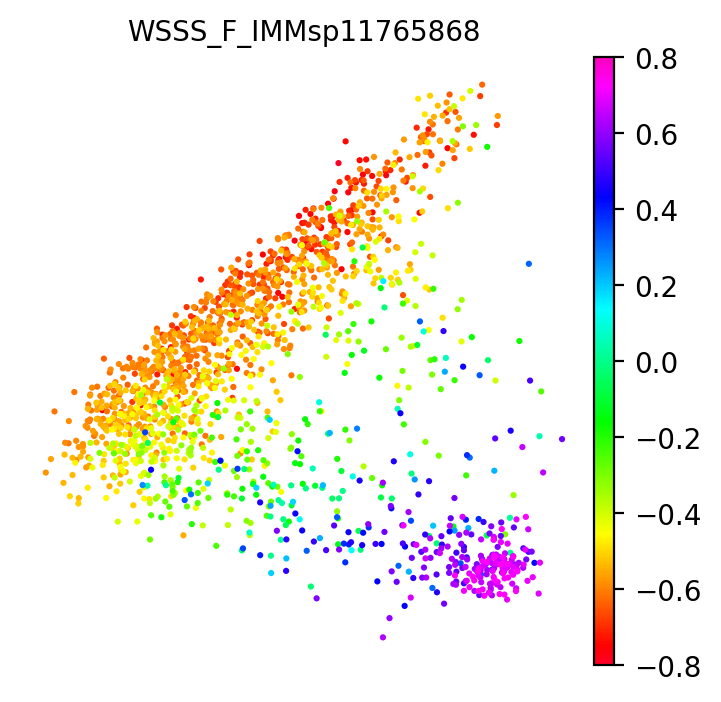

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


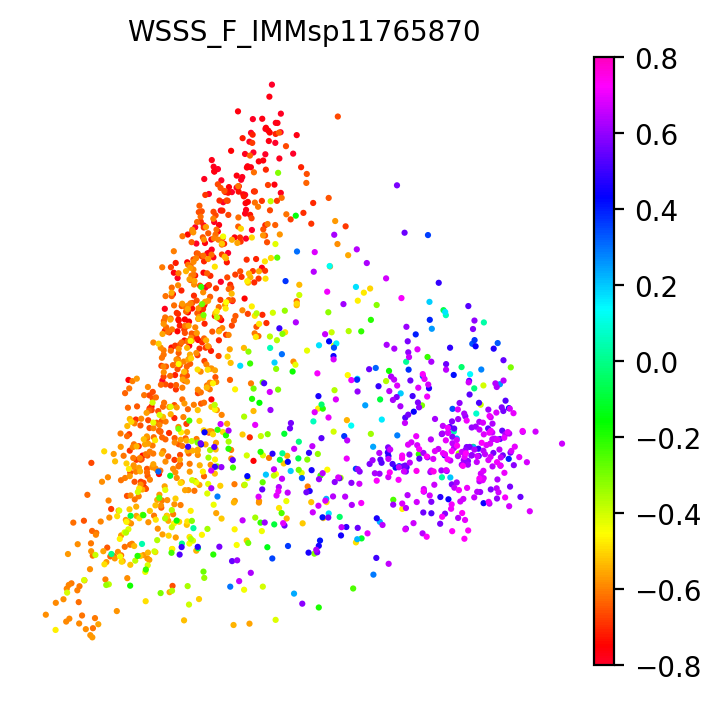

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


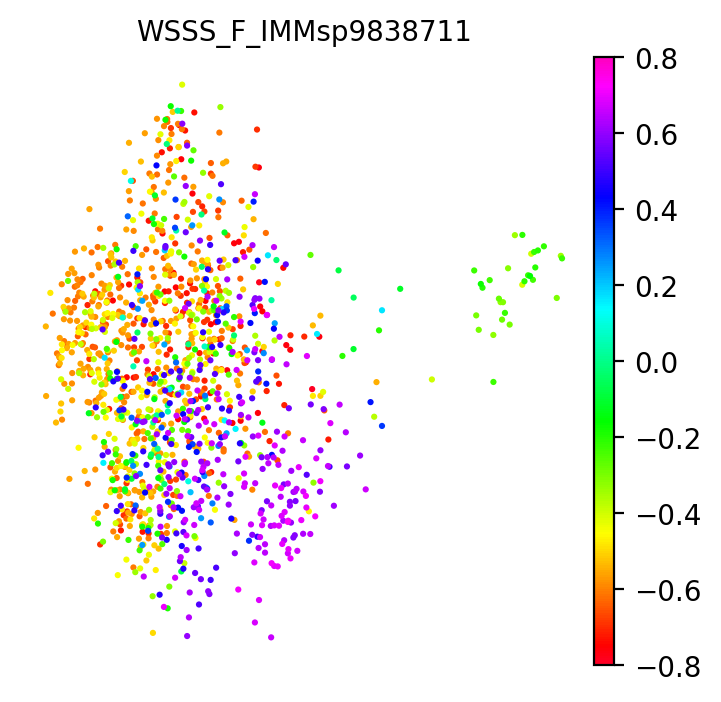

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1721: DeprecationWarning: NONE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.NEAREST or Dither.NONE instead.
  img = img.convert(mode='P', dither=Image.NONE,
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/matplotlib/backends/backend_pdf.py:1722: DeprecationWarning: ADAPTIVE is deprecated and will be removed in Pillow 10 (2023-07-01). Use Palette.ADAPTIVE instead.
  palette=Image.ADAPTIVE, colors=num_colors)


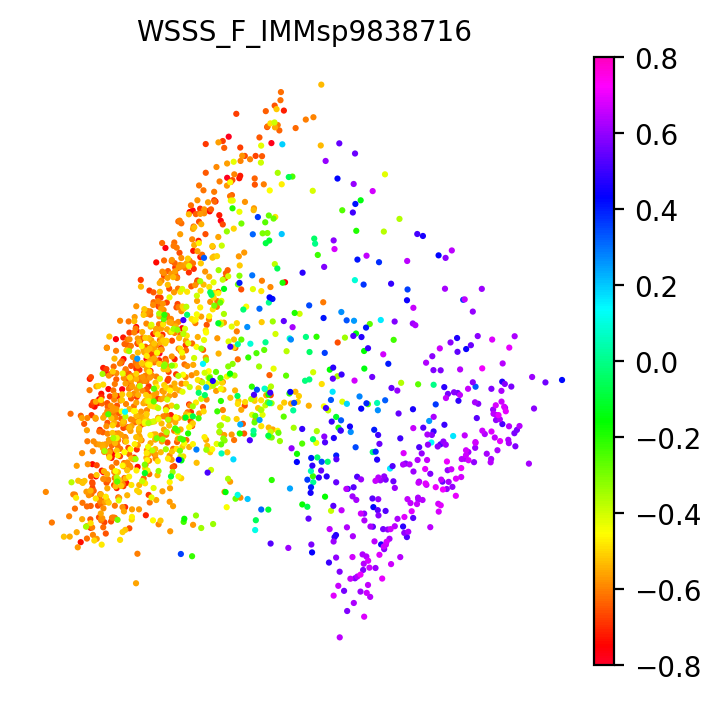

In [17]:
sc.set_figure_params(figsize=[4,4],fontsize=10,dpi=100)

for s in np.unique(adata_fet_filt.obs['SampleID']):
    adata = adata_fet_filt[adata_fet_filt.obs['SampleID']==s].copy()
    sc.pp.normalize_per_cell(adata)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pl.pca(adata, color = ['cma_v2']
           , title = s, frameon = False, cmap = 'gist_rainbow',save='_paed_sample_id'+s+'.pdf',s=20,vmin=-0.8,vmax=0.8)


In [14]:
adata_tmp = adata_fet_filt.copy()
cc_genes =  ['C1orf112', 'KDM1A', 'ARHGAP33', 'CDC27', 'AC004381.6', 'DBF4', 'PRSS21', 'E2F2', 'BAZ1B', 'NCAPD2', 'ANLN', 'BRCA1', 'UBR7', 'DDX11', 'TACC3', 'POLA2', 'DEPDC1', 'NCAPH2', 'HMGB3', 'CENPQ', 'DEPDC1B', 'SPDL1', 'TDP1', 'DSG2', 'NOP16', 'RFC2', 'RAD51', 'POLQ', 'THOC3', 'MRTO4', 'C4orf27', 'POLD1', 'TM7SF3', 'MCM10', 'MTHFD2', 'YBX1', 'ASPM', 'PRR11', 'NUCKS1', 'EXOC5', 'TCOF1', 'RAD18', 'TRIP13', 'DAZAP1', 'HLTF', 'PDCD2', 'SMC1A', 'HMMR', 'MCM2', 'NUP37', 'GTSE1', 'WDR62', 'MCM6', 'MLH1', 'UNG', 'SPAG5', 'UBE2T', 'EXOSC5', 'FAM76B', 'POLD3', 'KIF22', 'PUM3', 'RBL1', 'NDC80', 'HSPB11', 'OXCT1', 'SEH1L', 'ORC1', 'RAD54L', 'NOP14', 'GMCL1', 'AURKA', 'TPX2', 'BIRC5', 'KIF4A', 'FH', 'ORC6', 'G2E3', 'WDR76', 'PHGDH', 'CLSPN', 'NUP50', 'CDC45', 'CDC6', 'CBX5', 'MSH2', 'FKBP5', 'ACOT7', 'CDC7', 'RANBP1', 'CENPM', 'HMGXB4', 'MCM5', 'RANGAP1', 'POLE2', 'CDKN3', 'ERH', 'MTHFD1', 'VRK1', 'EMC9', 'GINS1', 'MYBL2', 'CDC25B', 'PLCB4', 'FAM83D', 'CEP76', 'RBBP8', 'POLA1', 'NUP93', 'CTCF', 'CCP110', 'CEP152', 'OIP5', 'MYEF2', 'MCM4', 'KCTD9', 'RNASEH2A', 'SGTA', 'ASF1B', 'LIG1', 'H2AFV', 'GARS', 'NUDT1', 'RPA3', 'EZH2', 'RHEB', 'SMC3', 'UBE2S', 'RAD51C', 'GALK1', 'C1QBP', 'BLMH', 'TMEM97', 'GAR1', 'NEIL3', 'WHSC1', 'NCAPG', 'CCDC34', 'CCDC86', 'MAGOHB', 'FOXM1', 'GPN3', 'RAD51AP1', 'RFC5', 'NUP107', 'TIMELESS', 'GAPDH', 'CDCA3', 'ENO2', 'FBXO5', 'MCM3', 'BAG2', 'GMNN', 'TTK', 'HMGCS1', 'BRD8', 'KIF20A', 'LMNB1', 'NUP155', 'H2AFY', 'SMC4', 'ECT2', 'CENPA', 'FHL2', 'MSH6', 'DHCR24', 'LRRC42', 'WDR77', 'SRM', 'MAD2L2', 'UCHL5', 'TTF2', 'SLC2A1', 'EBNA1BP2', 'CDC20', 'STMN1', 'NEK2', 'CENPF', 'KIF14', 'CASP8AP2', 'CTNNAL1', 'WDR34', 'PHF19', 'ACYP1', 'EPCAM', 'HELLS', 'CENPL', 'ACAT2', 'MASTL', 'EXOSC8', 'TMPO', 'NFYB', 'NCAPH', 'MND1', 'KIF18A', 'GPSM2', 'GTF3A', 'MRPS2', 'CCDC18', 'CISD1', 'ZWINT', 'CIT', 'DDX39A', 'CENPK', 'CDK2', 'TUBA1B', 'STIL', 'HJURP', 'EXOSC9', 'CKS2', 'ACSL3', 'CSE1L', 'HIST1H1D', 'HIST1H1A', 'DEK', 'GOT2', 'MGME1', 'MCM8', 'HNRNPR', 'BCL2L12', 'TRAP1', 'DLGAP5', 'YEATS4', 'PKMYT1', 'SRD5A3', 'PAICS', 'HAT1', 'KNSTRN', 'DUT', 'E2F8', 'FAM64A', 'MIS18BP1', 'SGOL1', 'RPS4Y1', 'LDLR', 'TOMM40', 'ATP8B3', 'LSM4', 'DNMT1', 'GINS2', 'TUBG1', 'PSMC3IP', 'THOC6', 'TOP2A', 'ENOSF1', 'RAN', 'RPA1', 'PCNA', 'NASP', 'RFC3', 'SLF1', 'LRRCC1', 'CCNB1', 'PSRC1', 'TMEM106C', 'LDHA', 'DDB2', 'CDCA8', 'TPGS2', 'SLC43A3', 'C9orf40', 'TROAP', 'ESPL1', 'NTPCR', 'CKAP2', 'BORA', 'NUDT15', 'BRIP1', 'ACTL6A', 'TXN', 'ODF2', 'SMC2', 'CDK5RAP2', 'ANP32B', 'DSCC1', 'ARHGEF39', 'PPIL1', 'TCF19', 'NRM', 'GGH', 'BUD13', 'CTDSPL2', 'NUSAP1', 'KIF23', 'CASC5', 'CENPO', 'KIF11', 'CEP55', 'KIF20B', 'DNA2', 'BARD1', 'MNS1', 'ZGRF1', 'CENPE', 'HADH', 'SLC39A8', 'NEDD1', 'BRCA2', 'DIAPH3', 'PIF1', 'FANCI', 'TICRR', 'SAMD1', 'SAE1', 'PLK4', 'ITGB3BP', 'KIF2C', 'UCK2', 'NUF2', 'ANP32E', 'DTL', 'ILF2', 'C1orf35', 'HNRNPLL', 'CHAC2', 'POLR2D', 'CDCA7', 'FANCD2', 'CCNA2', 'SKP2', 'PRIM2', 'MMS22L', 'PM20D2', 'MTFR2', 'CDCA5', 'NCAPG2', 'PRPS1', 'GINS4', 'HAUS6', 'CEP78', 'GTF3C5', 'MKI67', 'IMMP1L', 'SSRP1', 'INCENP', 'CCDC15', 'CHEK1', 'DSN1', 'HIRIP3', 'HMGA2', 'TEX30', 'NCAPD3', 'CENPU', 'CENPJ', 'SPC25', 'SUV39H2', 'CENPH', 'CARHSP1', 'CLGN', 'CCSAP', 'BUB3', 'SLFN13', 'SKA1', 'SLC16A1', 'TMEM237', 'ADK', 'FAM122B', 'AIFM1', 'ATAD2', 'SASS6', 'BUB1B', 'CCNB2', 'PSMG3', 'FAIM', 'CDC25C', 'MIS18A', 'ATP5G1', 'IGF2BP1', 'CHAF1B', 'NAE1', 'CCDC58', 'C21orf58', 'ZNF714', 'GPATCH4', 'YDJC', 'RACGAP1', 'SPC24', 'POLR3K', 'CCNF', 'ASRGL1', 'USP1', 'KIAA1524', 'SGOL2', 'TOPBP1', 'KIF15', 'WDR43', 'RFC4', 'RPL39L', 'RNF168', 'H2AFZ', 'CDC25A', 'POC1A', 'HMGB2', 'MAD2L1', 'PTTG1', 'RAD21', 'PSIP1', 'GKAP1', 'MELK', 'SLC7A3', 'SKA3', 'LRR1', 'HPRT1', 'E2F7', 'JAM3', 'BRD7', 'CENPN', 'LEO1', 'WEE1', 'MCM7', 'CENPV', 'SAAL1', 'FAM111A', 'KIAA0101', 'PLK1', 'XRCC6BP1', 'SNRPD1', 'RRM1', 'CDT1', 'CHAF1A', 'C19orf48', 'NUDT8', 'PRDX2', 'TK1', 'SAC3D1', 'PBK', 'HIST1H1E', 'DTYMK', 'RFWD3', 'FEN1', 'ING2', 'CDKN2AIP', 'SNRNP48', 'USP39', 'CKAP2L', 'BUB1', 'ELP5', 'CDK1', 'CDCA4', 'SHCBP1', 'PGAM1', 'ESCO2', 'RHNO1', 'CTPS1', 'RRM2', 'THOP1', 'C5orf34', 'POP7', 'ZNF738', 'CKS1B', 'GMPPB', 'CNP', 'CBX2', 'C16orf91', 'EXO1', 'ZWILCH', 'ANKRD36C', 'UBE2C', 'CKAP5', 'CCNE2', 'CCDC14', 'RMI2', 'TOMM5', 'RUVBL1', 'ATAD5', 'LMNB2', 'TYMS', 'PXMP2', 'SHMT1', 'POLE', 'PAWR', 'PIDD1', 'GSG2', 'GEN1', 'RMI1', 'AURKB', 'RCC1', 'PPA1', 'HIST3H2A', 'MRPS23', 'RTKN2', 'IDH2', 'KPNA2', 'CEP97', 'GLRX5', 'SKA2', 'CEP57L1', 'PSMG1', 'SFXN4', 'ALYREF', 'TRAIP', 'LIN9', 'KMT5A', 'PGP', 'CMSS1', 'HIST2H2AC', 'HIST1H1B', 'KNTC1', 'CDCA2', 'H1FX', 'SIVA1', 'PARPBP', 'KIF18B', 'ERCC6L', 'PTMA', 'HSPA14', 'FANCA', 'ARHGAP11B', 'TUBB4B', 'CENPP', 'H2AFX', 'FAM72B', 'FAM221A', 'FAM111B', 'HN1', 'HMGB1', 'TUBB', 'IARS', 'ERI2', 'HIST1H4C', 'BLM', 'PRIM1', 'HMGN5', 'SVIP', 'TFDP1', 'TXNRD1', 'WDHD1', 'EIF1AY', 'ARHGAP11A', 'HMGN2', 'DCAF12', 'PRC1', 'CCDC167', 'CENPW', 'GPANK1', 'MZT1', 'C4orf46', 'KLHL23', 'MXD3', 'DNAJC9', 'IFRD2', 'CKLF', 'FANCG', 'DHFR', 'DLEU2', 'AP000251.3', 'KIFC1', 'CRNDE', 'C8orf88', 'PRKDC', 'BOP1', 'RP11-196G18.23', 'CTC-260E6.6', 'NCBP2-AS2', 'HIST1H3G', 'HIST1H2AH', 'UHRF1', 'RDM1', 'HIST1H2AM']
def remove_selected_genes(adata,lst,remove_also_mt=True):
    for g in lst:
        adata = adata[:,~(adata.var_names==g)]
    if remove_also_mt:
        adata = adata[:,~(adata.var_names.str.startswith('MT-'))]
    return adata

adata_tmp = remove_selected_genes(adata_tmp,cc_genes,remove_also_mt=True)  

sc.pp.highly_variable_genes(
        adata_tmp,
        n_top_genes=5000,
        subset=True,
        # Level='counts',
        flavor="seurat_v3",
        batch_key='SampleID',
        span=1,
    )
import re

for i in adata_tmp.var.index:
    if re.search('^TR[AB][VDJ]|^IG[HKL][VDJC]', i):
        adata_tmp.var.at[i, 'highly_variable'] = False
adata_tmp = adata_tmp[:,adata_tmp.var.highly_variable]
    

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


In [15]:
adata_tmp = adata_tmp.copy()
import warnings
warnings.filterwarnings('once')
scvi.model.SCVI.setup_anndata(adata_tmp, batch_key='SampleID', \
                        categorical_covariate_keys=['SlideID','Spaceranger','section_thickness (um)','DonorID'],continuous_covariate_keys=['Age(numeric)','n_genes_by_counts'])
vae = scvi.model.SCVI(adata_tmp,n_layers=2, n_latent=30)
vae.train(max_epochs=300,batch_size=2000)
adata_fet_filt.obsm["X_scVI"] = vae.get_latent_representation() # return batch corrections to original anndata
sc.pp.neighbors(adata_fet_filt, use_rep="X_scVI")
sc.tl.umap(adata_fet_filt, min_dist = 0.1, spread = 1)
sc.tl.leiden(adata_fet_filt, resolution=0.5,key_added='leiden_05')
sc.tl.leiden(adata_fet_filt, resolution=1,key_added='leiden_1')

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/torch/distributed/_sharded_tensor/__init__.py:8: DeprecationWarning: torch.distributed._sharded_tensor will be deprecated, use torch.distributed._shard.sharded_tensor instead
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/trainer/data_loading.py:428: UserWarning: The number of training samples (6) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 74/300:  24%|██▍       | 73/300 [13:30<43:50, 11.59s/it, loss=2.92e+03, v_num=1] 

/home/jovyan/my-conda-envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/trainer/trainer.py:688: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


KeyboardInterrupt: 

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:444: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(cax, ax=ax, pad=0.01, fraction=0.08, aspect=30)


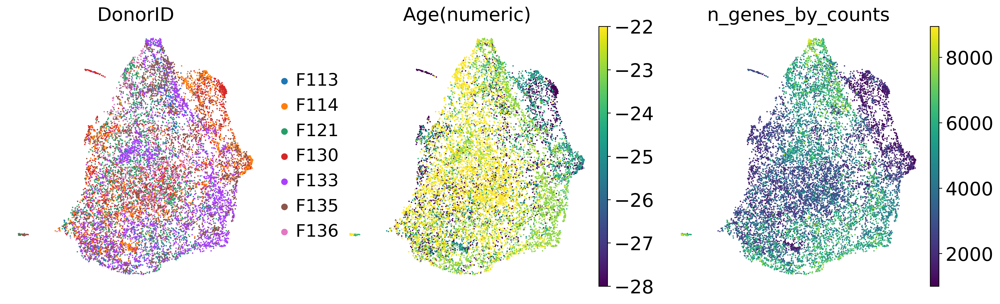

AnnData object with n_obs × n_vars = 13031 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 'Cortico_Medullar_Axis', 'SampleID', 'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 'L2_dist_log10_Annotation_lv_1_Large vessel', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN

In [236]:
sc.set_figure_params(figsize=[5,5],fontsize=20,dpi=200)

sc.pl.umap(adata_fet_filt, color = ['DonorID','Age(numeric)','n_genes_by_counts',']
           , frameon = False, cmap = 'viridis',save='_fetal_donoID_age.pdf')
adata_fet_filt

In [61]:
anno = list(adata_fet_filt.obs.Annotation_lv_1.cat.categories[:-1])
anno

['HS', 'Lymph', 'PVS']

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


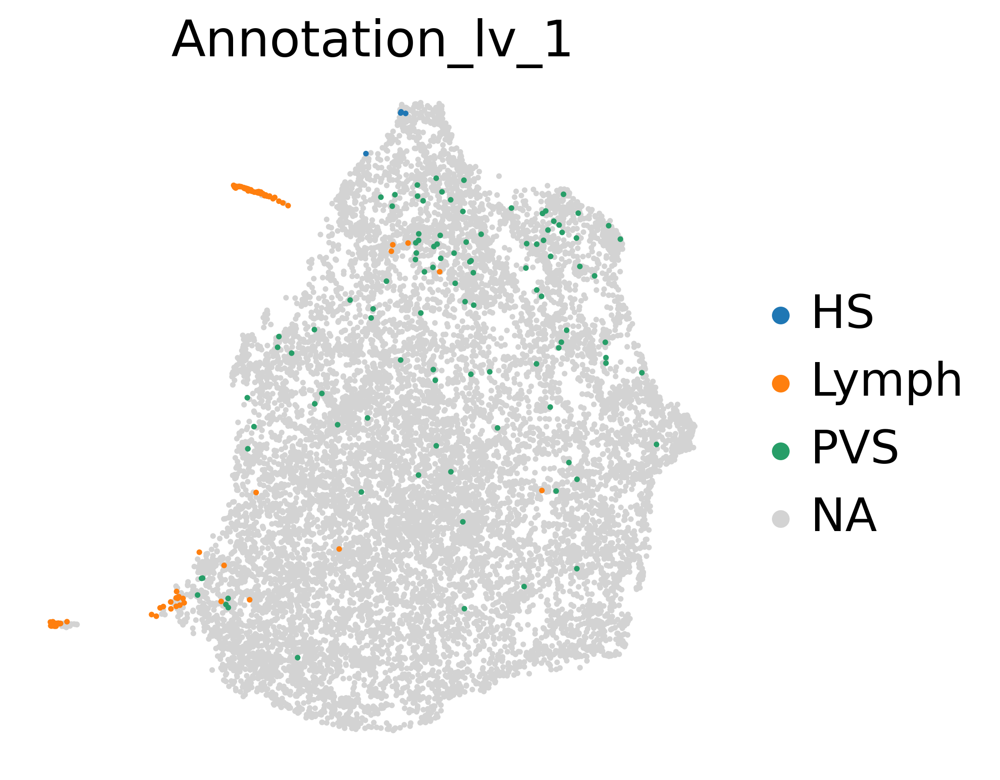

AnnData object with n_obs × n_vars = 13031 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 'Cortico_Medullar_Axis', 'SampleID', 'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 'L2_dist_log10_Annotation_lv_1_Large vessel', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN

In [237]:
sc.set_figure_params(figsize=[5,5],fontsize=20,dpi=200)

sc.pl.umap(adata_fet_filt, color = ["Annotation_lv_1"],groups=anno
           , frameon = False, cmap = 'viridis',save='_fetal_Annotation_lv_1.pdf',s=20)
adata_fet_filt

In [98]:
sc.set_figure_params(figsize=[5,5],fontsize=10,dpi=200)

tmp_adata = adata_fet_filt.copy()
tmp_adata.obs.L2_dist_Annotation_lv_0_Edge.loc[adata_fet_filt.obs.L2_dist_Annotation_lv_0_Edge>300] = 300

/tmp/ipykernel_51976/1624346199.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp_adata.obs.L2_dist_Annotation_lv_0_Edge.loc[adata_fet_filt.obs.L2_dist_Annotation_lv_0_Edge>300] = 300


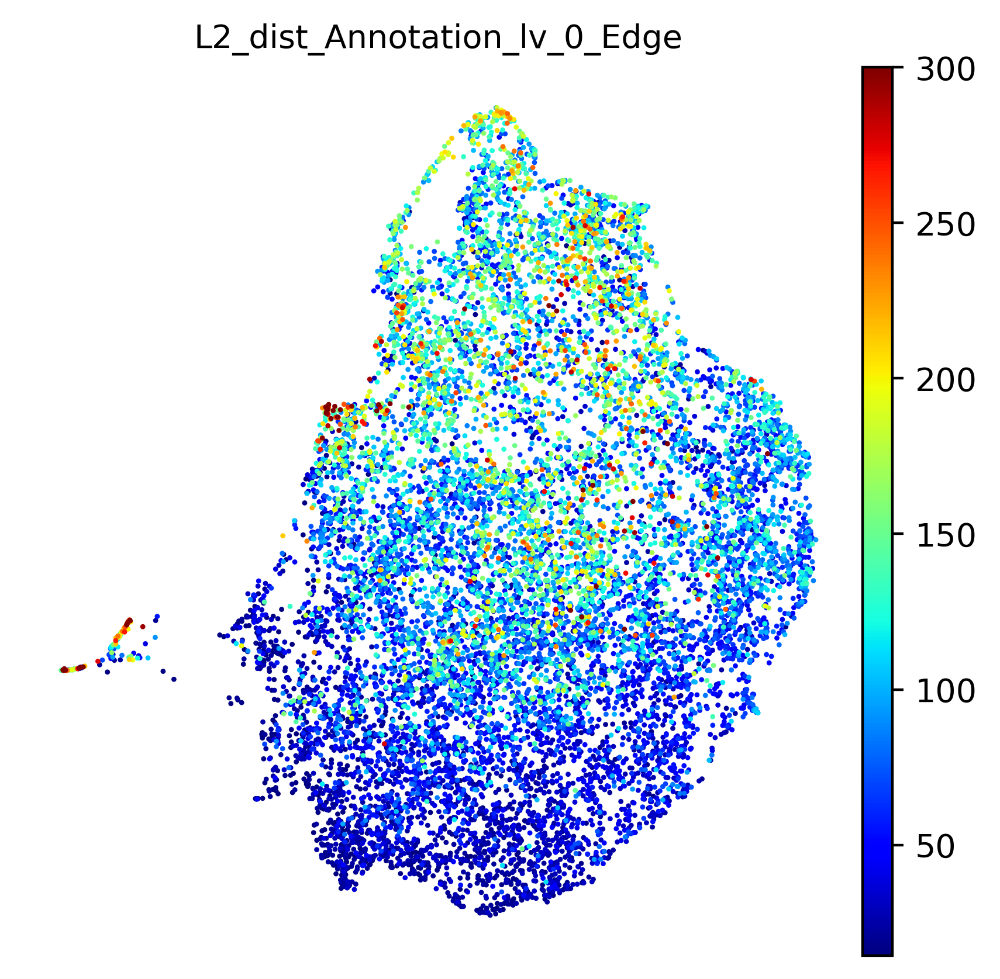

In [99]:
sc.pl.umap(tmp_adata, color = ["L2_dist_Annotation_lv_0_Edge"]
           , frameon = False, cmap = 'jet',save='_fetal_L2_edge.pdf',s=10)

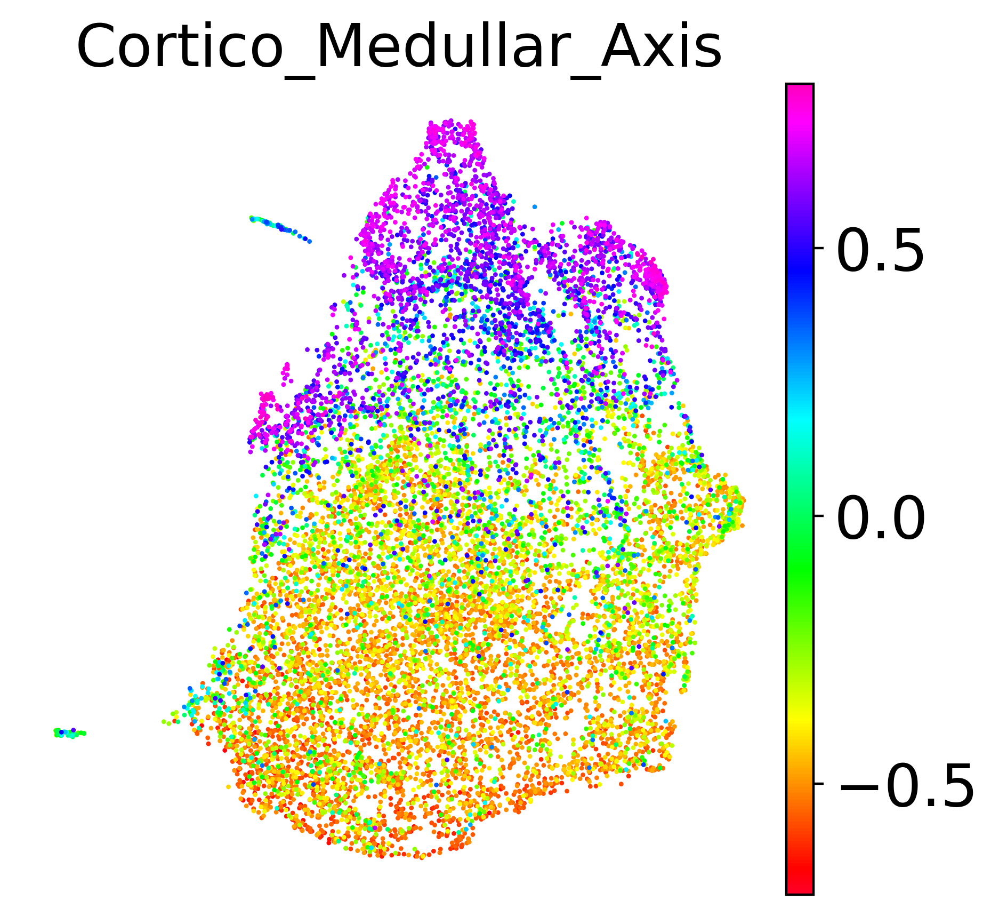

AnnData object with n_obs × n_vars = 13031 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 'Cortico_Medullar_Axis', 'SampleID', 'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 'L2_dist_log10_Annotation_lv_1_Large vessel', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN

In [239]:
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/')
sc.pl.umap(adata_fet_filt, color = ['Cortico_Medullar_Axis'],s=10, frameon = False, cmap = 'gist_rainbow',save='_fetal_CMA_v10.pdf')
adata_fet_filt

<AxesSubplot:>

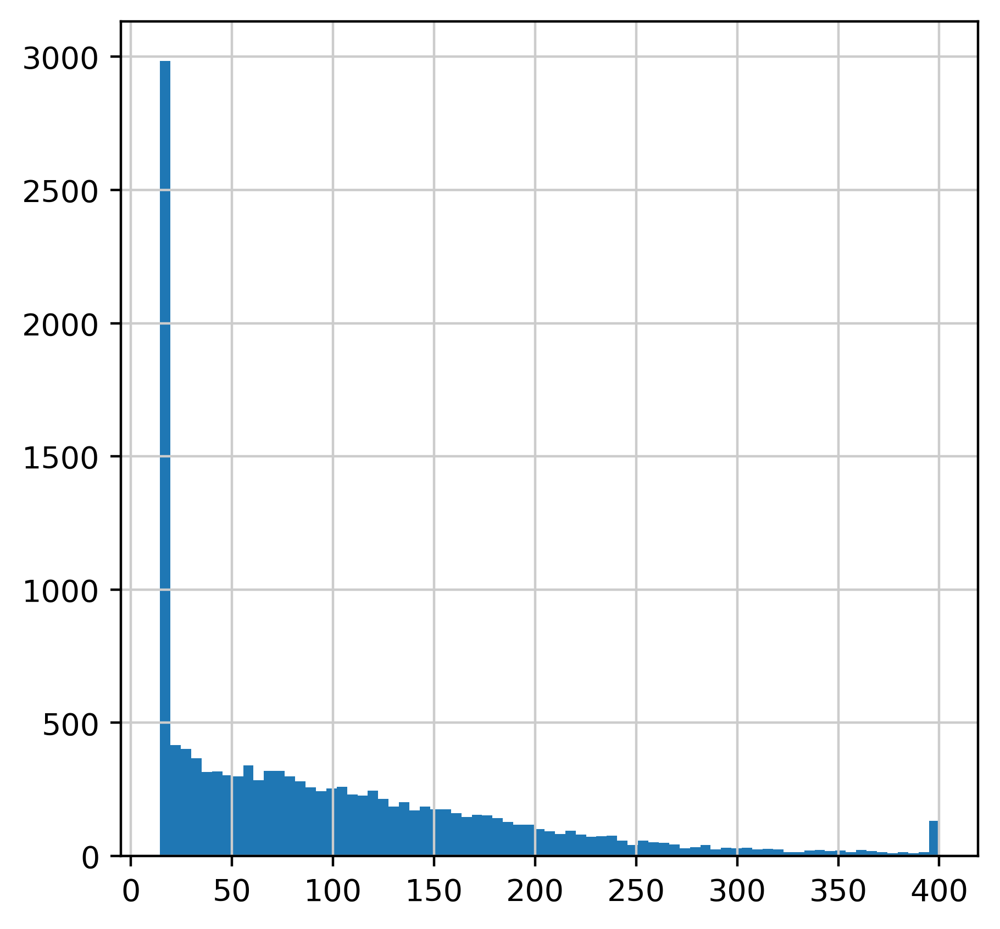

In [93]:
tmp_adata.obs.L2_dist_Annotation_lv_0_Medulla.hist(bins=75)

/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)
/nfs/team205/ny1/miniconda/miniconda3/envs/scvi-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1227: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


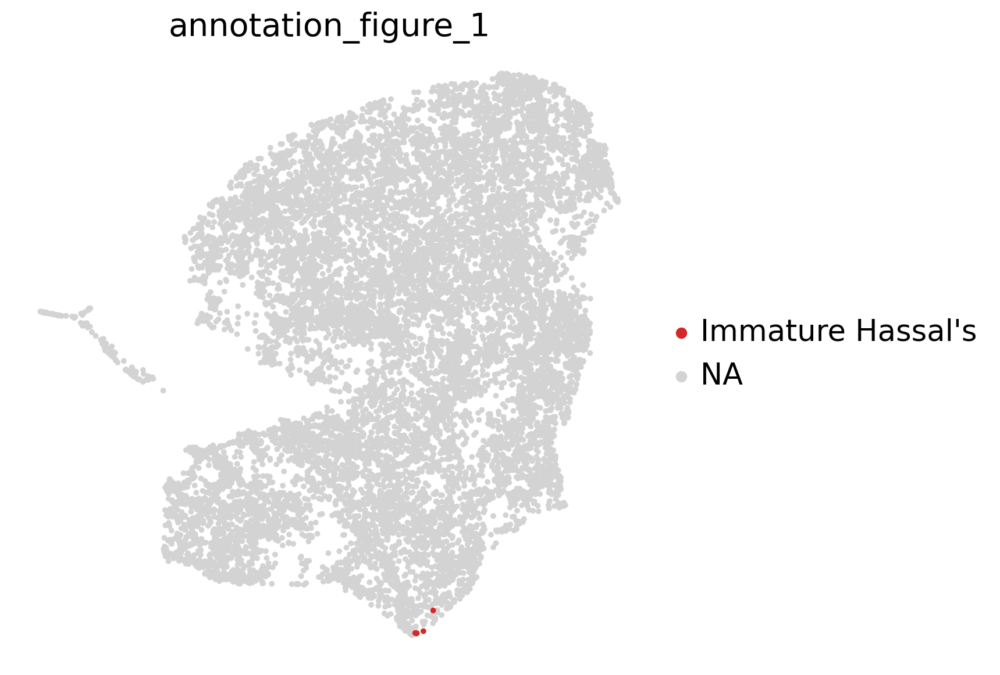

In [15]:
sc.set_figure_params(figsize=[7,7],fontsize=20,dpi=100)
sc.pl.umap(adata_fet_filt, color = ['annotation_figure_1'],groups=["Immature Hassal's"] ,frameon = False,s=50)

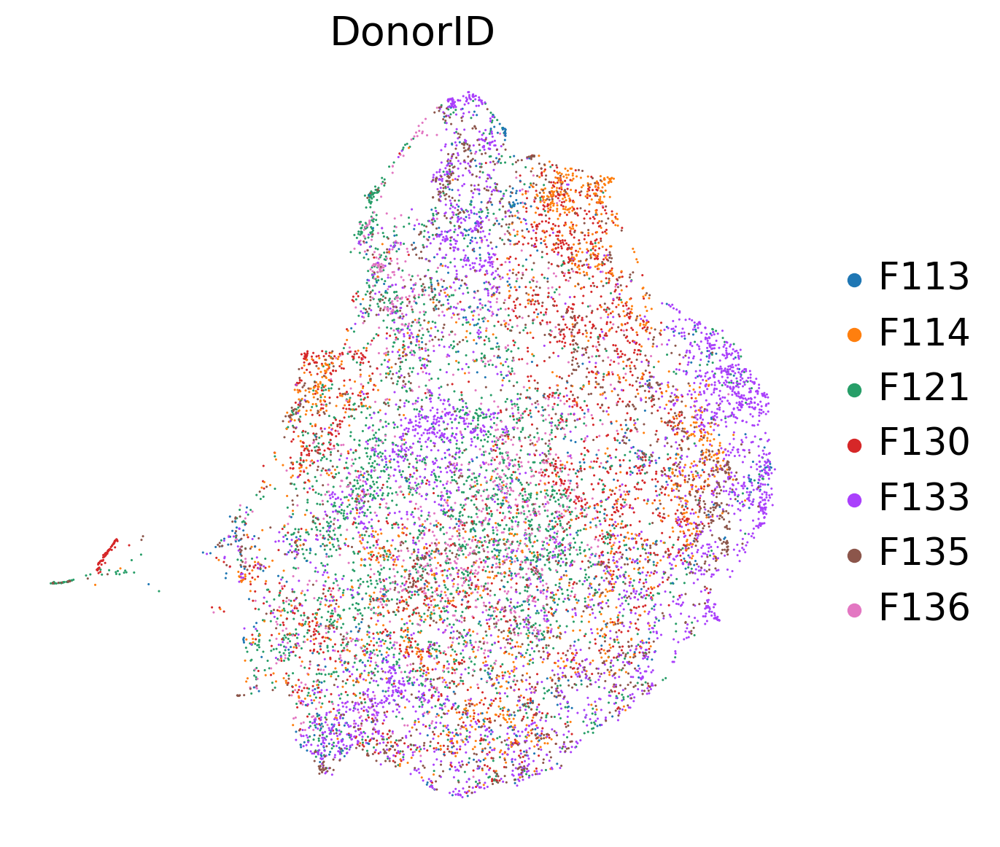

In [100]:
sc.set_figure_params(figsize=[7,7],fontsize=20,dpi=100)
sc.pl.umap(adata_fet_filt, color ='DonorID', frameon = False,s=5)

In [101]:
adata_fet_filt.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_fetal_filt_v9.h5ad')

## Analyse fetal 

AnnData object with n_obs × n_vars = 12860 × 12000
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'cma_v1', 'SampleID', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN/DV200', 'Spatial_type', 'DonorID', 'Donor_type', 'Age_group', 'Age(misc)', 'Age(numeric)', 'Source', 'Sex', 'QC', 'Batch', 'CMA version ', 'Spaceranger', 'Comments', 'Medians Genes per Spot (>1500)', 'Mean Reads per spot ', 'Median UMI per spot ', 'Usefull region out of tissue (>30%)', 'Tissue Morphology ', 'Spots under tissue', 'Fraction of reads in tissue', 'Sample Rank', 'original_image_name', 'old_sample_name', 'annotation_type', 'uploaded_annotated', 'annotated_path', '_indices', '_scvi_batch', '_scvi_labels', 'B(P)', 'B(Q)', 'B-pro/pre', 'DC-a1', 'DC-a3', 'DC1', 'DC2', 'EC-Art

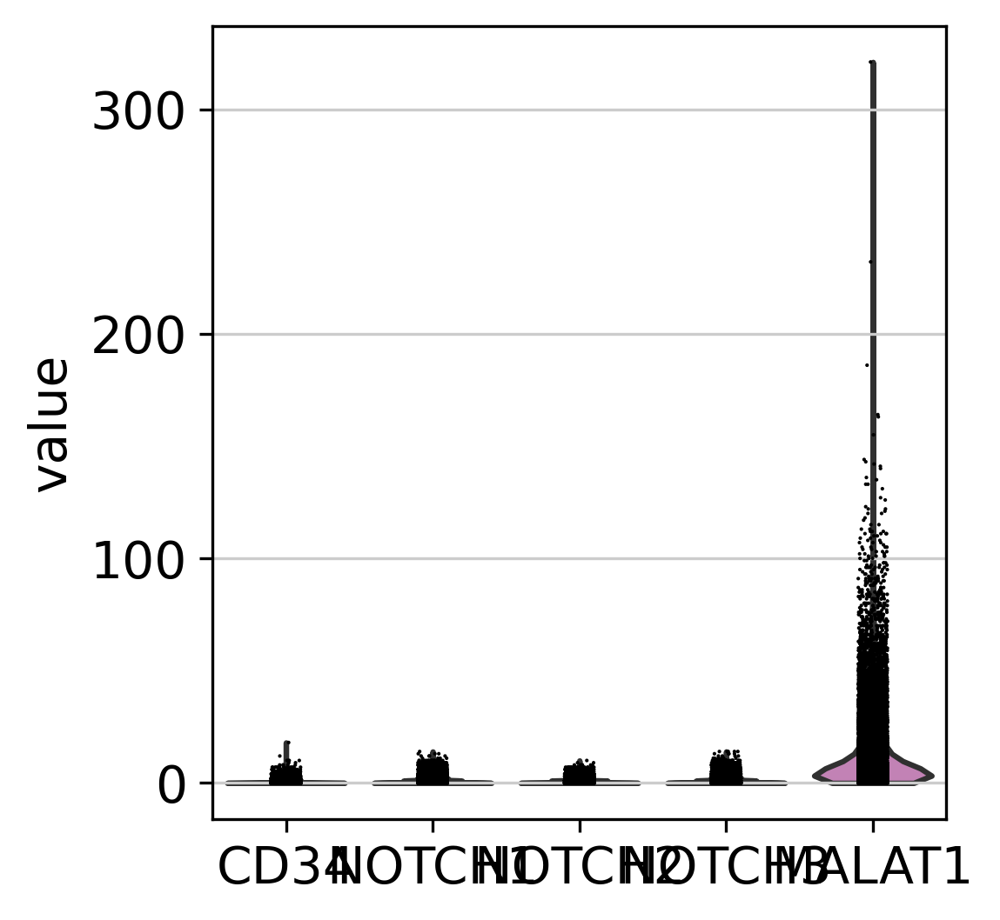

In [81]:
# adata_fet_filt = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_fetal_filt_v9.h5ad')
adata_fet_filt.layers['counts'] = adata_fet_filt.X
adata_fet_filt

list = ['CD34','NOTCH1','NOTCH2','NOTCH3','MALAT1']

sc.pl.violin(adata_fet_filt, keys =list,layer='counts')

In [19]:
# remove artifacts structures 
import warnings
warnings.filterwarnings('ignore')

adata_fet_cma = adata_fet_filt[adata_fet_filt.obs['annotation_figure_1']!="Lymph Aggregates"].copy()

## remove meduala less lobules 
adata_fet_cma.obs['full_lobule'] = 0
for s in adata_fet_cma.obs['SampleID'].cat.categories.tolist():
    sample = adata_fet_cma[adata_fet_cma.obs['SampleID'].isin([s])]
    for l in sample.obs['annotations_lobules_0'].cat.categories:
        lobule = sample.obs['annotations_lobules_0'] == l
        med = np.where(sample.obs['annotation_figure_1'][lobule] == 'Medulla')[0]
        cortex = np.where(sample.obs['annotation_figure_1'][lobule] == 'Cortex')[0]
        if (cortex.size>=3) & (med.size>=3):
            adata_fet_cma.obs['full_lobule'][lobule.iloc[np.where(lobule)].index] = 1
adata_fet_cma.obs['full_lobule'] = adata_fet_cma.obs['full_lobule'].astype('category')
adata_fet_cma.obs['full_lobule'].value_counts()
adata_fet_cma = adata_fet_cma[adata_fet_cma.obs['full_lobule']==1] # remove spots that don't have either medullar or cortical data

sc.set_figure_params(figsize=[7,7],fontsize=20,dpi=100)
# sc.pl.umap(adata_fet_cma, color ='annotation_figure_1', frameon = False,s=5)

1    8399
0    4349
Name: full_lobule, dtype: int64

In [122]:

import seaborn as sns

def get_cluster_proportions(adata,
                            cluster_key="cluster_final",
                            sample_key="replicate",
                            drop_values=None):
    """
    Input
    =====
    adata : AnnData object
    cluster_key : key of `adata.obs` storing cluster info
    sample_key : key of `adata.obs` storing sample/replicate info
    drop_values : list/iterable of possible values of `sample_key` that you don't want
    
    Returns
    =======
    pd.DataFrame with samples as the index and clusters as the columns and 0-100 floats
    as values
    """
    
    adata_tmp = adata.copy()
    sizes = adata_tmp.obs.groupby([cluster_key, sample_key]).size()
    props = sizes.groupby(level=1).apply(lambda x: 100 * x / x.sum()).reset_index() 
    props = props.pivot(columns=sample_key, index=cluster_key).T
    props.index = props.index.droplevel(0)
    props.fillna(0, inplace=True)
    
    if drop_values is not None:
        for drop_value in drop_values:
            props.drop(drop_value, axis=0, inplace=True)
    return props

In [123]:
cts = list(adata_fet_cma.obs['annotation_figure_1'].cat.categories)
ct_color_map = dict(zip(cts, np.array(sns.color_palette("husl", len(cts)))[range(len(cts))]))


In [124]:
props = get_cluster_proportions(adata_fet_cma,
                            cluster_key='annotation_figure_1',
                            sample_key="binCMA",
                            drop_values=None)
adata_fet_cma

AnnData object with n_obs × n_vars = 9324 × 13577
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'L2_dist_Annotation_lv_0_Artifacts', 'Annotation_lv_0', 'L2_dist_Annotation_lv_0_Background', 'L2_dist_Annotation_lv_0_Cortex', 'L2_dist_Annotation_lv_0_Edge', 'L2_dist_Annotation_lv_0_Medulla', 'L2_dist_log10_Annotation_lv_1_HS', 'Annotation_lv_1', 'L2_dist_log10_Annotation_lv_1_Lymph', 'L2_dist_log10_Annotation_lv_1_PVS', 'L2_dist_log10_Annotation_lv_1_Unassigned', 'Annotation_lobules', 'Cortico_Medullar_Axis', 'SampleID', 'L2_dist_Annotation_lv_0_Unassigned', 'Annotation_lobules_0', 'Annotation_lobules_1', 'L2_dist_log10_Annotation_lv_1_Fat', 'Leiden_0_5', 'L2_dist_log10_Annotation_lv_1_Large vessel', 'Sample ', 'Sample_hr', 'SlideID', 'Position', 'Image_name', 'Image_jpg', 'section_thickness (um)', 'permebialisation(min)', 'RIN/

In [125]:
sc.set_figure_params(figsize=[5,5],fontsize=6,dpi=100)

def plot_cluster_proportions(cluster_props, 
                             cluster_palette=ct_color_map,
                             xlabel_rotation=0): 
    fig, ax = plt.subplots(dpi=300)
    fig.patch.set_facecolor("white")
    
    cmap = None
    if cluster_palette is not None:
        cmap = sns.palettes.blend_palette(
            cluster_palette, 
            n_colors=len(cluster_palette), 
            as_cmap=True)
   
    cluster_props.plot(
        kind="bar", 
        stacked=True, 
        ax=ax, 
        legend=None, 
        colormap=cmap
    )
    
    ax.legend(bbox_to_anchor=(1.01, 1), frameon=False, title="Cluster")
    sns.despine(fig, ax)
    # ax.tick_params(axis="x", rotation=xlabel_rotation)
    ax.set_xlabel(cluster_props.index.name.capitalize())
    ax.set_ylabel("Proportion")
    fig.tight_layout()
    ax.grid(False)
    return fig
    

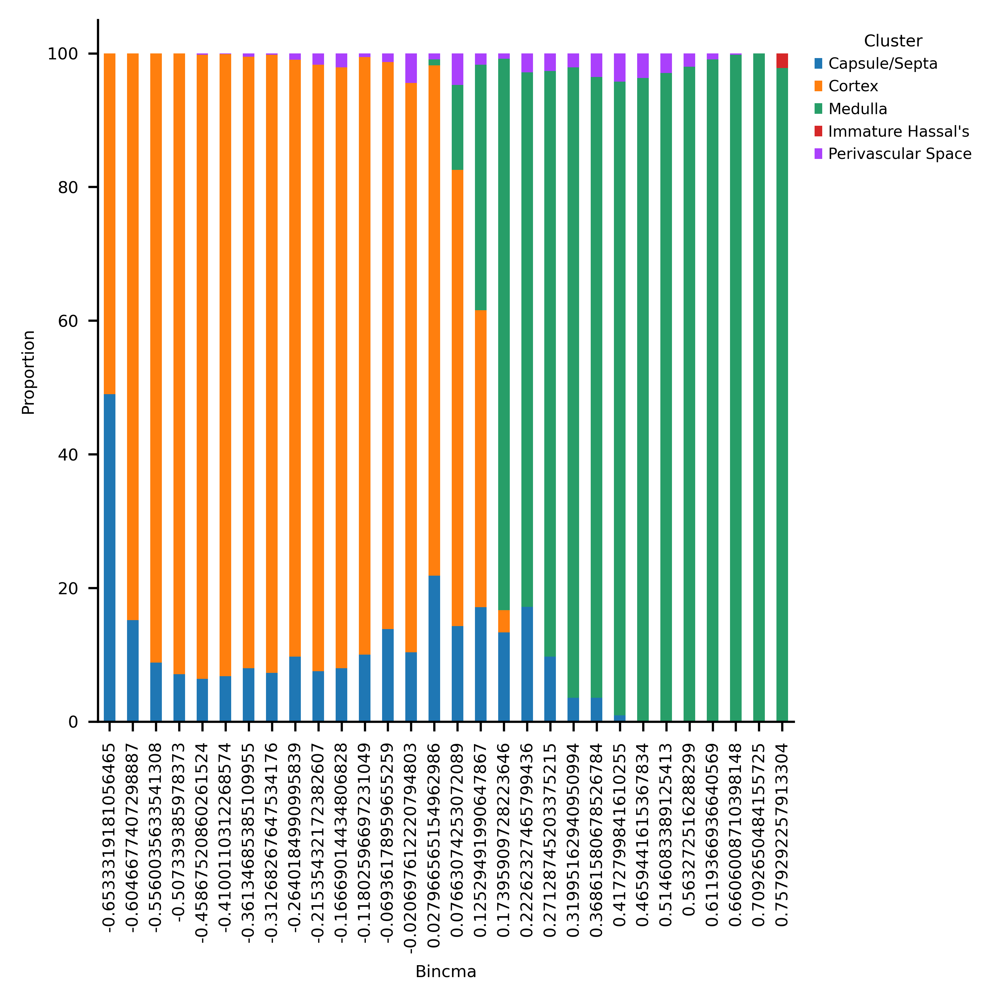

In [127]:
fig = plot_cluster_proportions(props, 
                             cluster_palette=None,
                             xlabel_rotation=0)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/')
fig.savefig('figures/fetal_morphological_groups_per_CMA_level.pdf')

In [147]:
# manual annotations
import seaborn as sns
# label DP(Q) cells with pseudotime later than abt_mean as DP_late
adata_fet_cma.obs['cma_bin_manual'] = adata_fet_cma.obs['annotation_figure_1'].astype('object')
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<-0.60) ,'cma_bin_manual'] = 'Capsular'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=-0.60) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<-0.54),'cma_bin_manual'] = 'Sub-Capsular'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=-0.54) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<-0.38),'cma_bin_manual'] = 'Cortical Level I'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=-0.38) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<-0.18),'cma_bin_manual'] = 'Cortical Level II'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=-0.18) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<-0.06),'cma_bin_manual'] = 'Cortical Level III'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=-0.06) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<0.11),'cma_bin_manual'] = 'Cortical CMJ'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=0.11) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<0.22),'cma_bin_manual'] = 'Medullar CMJ'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=0.22) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<0.46),'cma_bin_manual'] = 'Medullar Level I'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=0.46) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<0.61),'cma_bin_manual'] = 'Medullar Level II'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=0.61) & np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']<0.71),'cma_bin_manual'] = 'Medullar Level III'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['Cortico_Medullar_Axis']>=0.71),'cma_bin_manual'] = 'Medullar Deep'
adata_fet_cma.obs.loc[np.array(adata_fet_cma.obs['annotation_figure_1']=='Capsule/Septa') ,'cma_bin_manual'] = 'Capsular'
adata_fet_cma.obs['cma_bin_manual'] = adata_fet_cma.obs['cma_bin_manual'].astype('category')


ct_order = ['Capsular','Sub-Capsular','Cortical Level I','Cortical Level II','Cortical Level III','Cortical CMJ','Medullar CMJ','Medullar Level I','Medullar Level II','Medullar Level III','Medullar Deep']
adata_fet_cma.obs['cma_bin_manual'] = adata_fet_cma.obs['cma_bin_manual'].cat.reorder_categories(ct_order)
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
adata_fet_cma.obs['cma_bin_manual'].value_counts()

Cortical Level I      2465
Cortical Level II     1490
Medullar Level II      896
Medullar Level III     824
Capsular               590
Medullar Level I       582
Cortical Level III     436
Sub-Capsular           396
Cortical CMJ           349
Medullar Deep          295
Medullar CMJ           199
Name: cma_bin_manual, dtype: int64

In [127]:
adata_fet_cma.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_fetal_filt_v9_cma.h5ad')
adata_fet_cma

In [214]:
adata_fet_cma = sc.read_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2/adata_fetal_filt_v9_cma.h5ad')

In [84]:
sc.pp.normalize_total(adata_fet_cma,target_sum=3000)
sc.pp.log1p(adata_fet_cma)

In [209]:
# sc.pp.combat(adata_fet_cma, key='SampleID', inplace=True)

Found 207 genes with zero variance.


# explore gene expression 

In [90]:
adata_fet_cma.obs['manual_bin_cma_v2'] = adata_fet_cma.obs['manual_bin_cma_v2'].astype('category')
adata_fet_cma.obs['manual_bin_cma_v2'].value_counts()

Cortical level II     1743
Capsular              1171
Medullar CMJ          1007
Medullar level I       863
Cortical level I       828
Cortical CMJ           795
Sub-Capsular           595
Medullar level II      563
Cortical level III     535
Medullar level III     248
Medullar Deep           51
Name: manual_bin_cma_v2, dtype: int64

In [20]:
# ct_order = ['Capsular','Sub-Capsular','Cortical Level I','Cortical Level II','Cortical Level III','Cortical CMJ','Medullar CMJ','Medullar Level I','Medullar Level II','Medullar Level III','Medullar Deep']
ct_order = ['Capsular','Sub-Capsular','Cortical level I','Cortical level II','Cortical level III','Cortical CMJ','Medullar CMJ','Medullar level I','Medullar level II','Medullar level III','Medullar Deep']

adata_fet_cma.obs['manual_bin_cma_v2'] = adata_fet_cma.obs['manual_bin_cma_v2'].cat.reorder_categories(ct_order)

In [21]:
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("tab20", len(ct_order)))[range(len(ct_order))]))
adata_fet_cma.obs['manual_bin_cma_v2'].value_counts()

Cortical level II     1743
Capsular              1171
Medullar CMJ          1007
Medullar level I       863
Cortical level I       828
Cortical CMJ           795
Sub-Capsular           595
Medullar level II      563
Cortical level III     535
Medullar level III     248
Medullar Deep           51
Name: manual_bin_cma_v2, dtype: int64

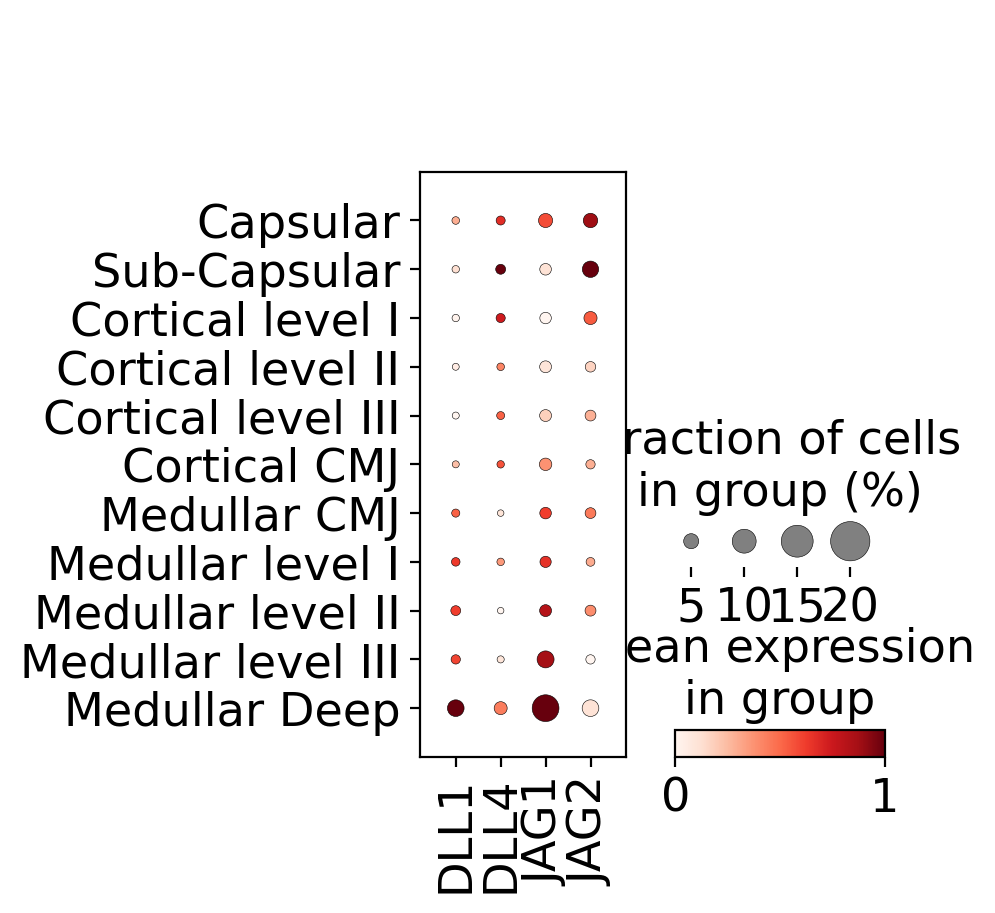

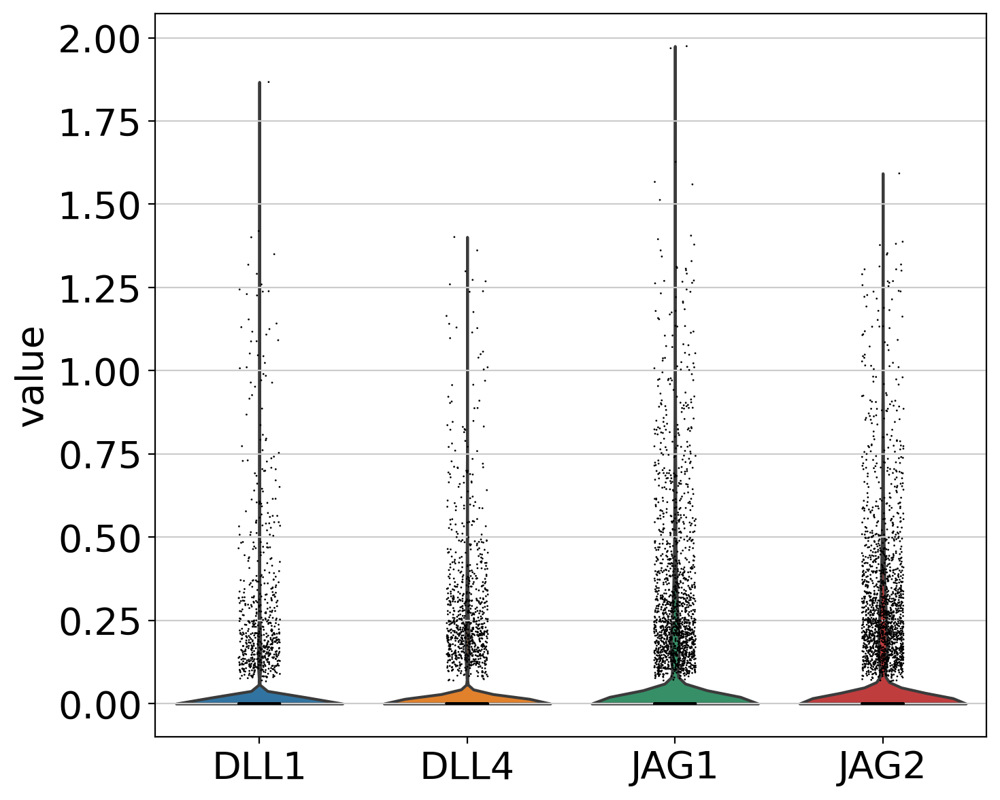

In [93]:
list = ['DLL1','DLL4','JAG1','JAG2']
sc.pl.dotplot(adata_fet_cma,var_names=list,groupby='manual_bin_cma_v2',cmap='Reds',standard_scale='var',
              expression_cutoff=0.5,smallest_dot=20)
sc.pl.violin(adata_fet_cma, keys =list)

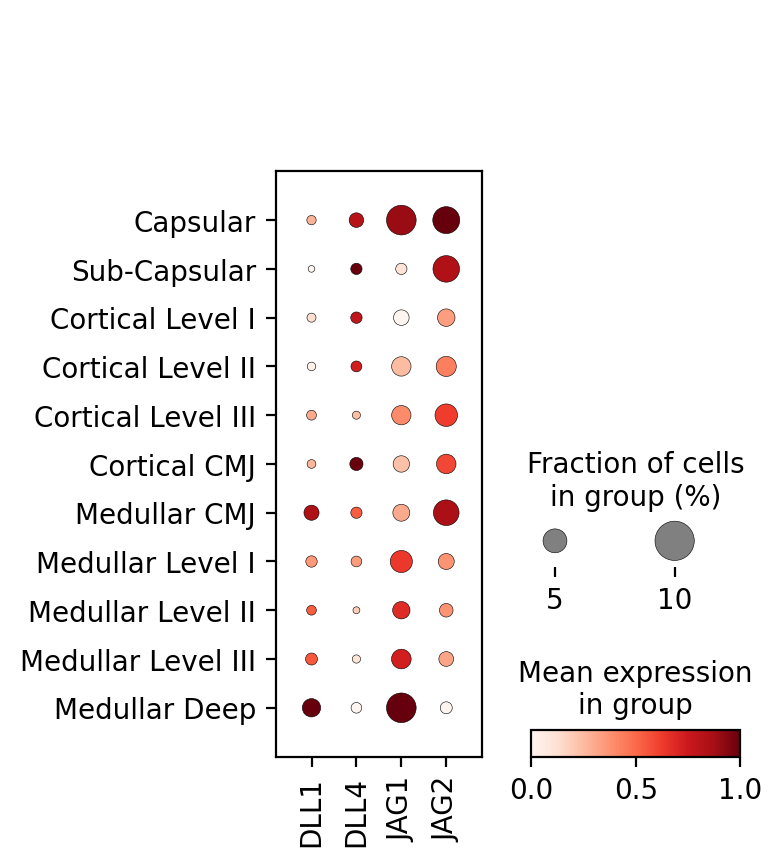

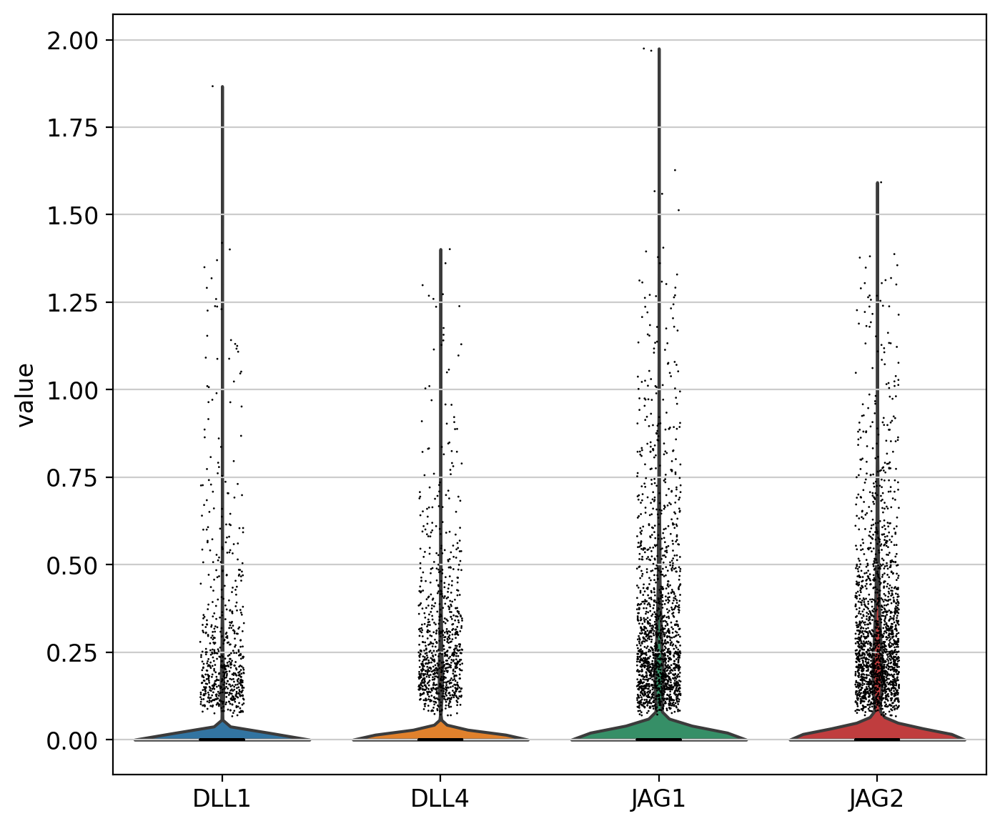

In [74]:
list = ['DLL1','DLL4','JAG1','JAG2']
sc.pl.dotplot(adata_fet_cma,var_names=list,groupby='cma_bin_manual',cmap='Reds',standard_scale='var',
              expression_cutoff=0.5,smallest_dot=5)
sc.pl.violin(adata_fet_cma, keys =list)

In [94]:
sc.pp.pca(adata_fet_cma, n_comps = 10)

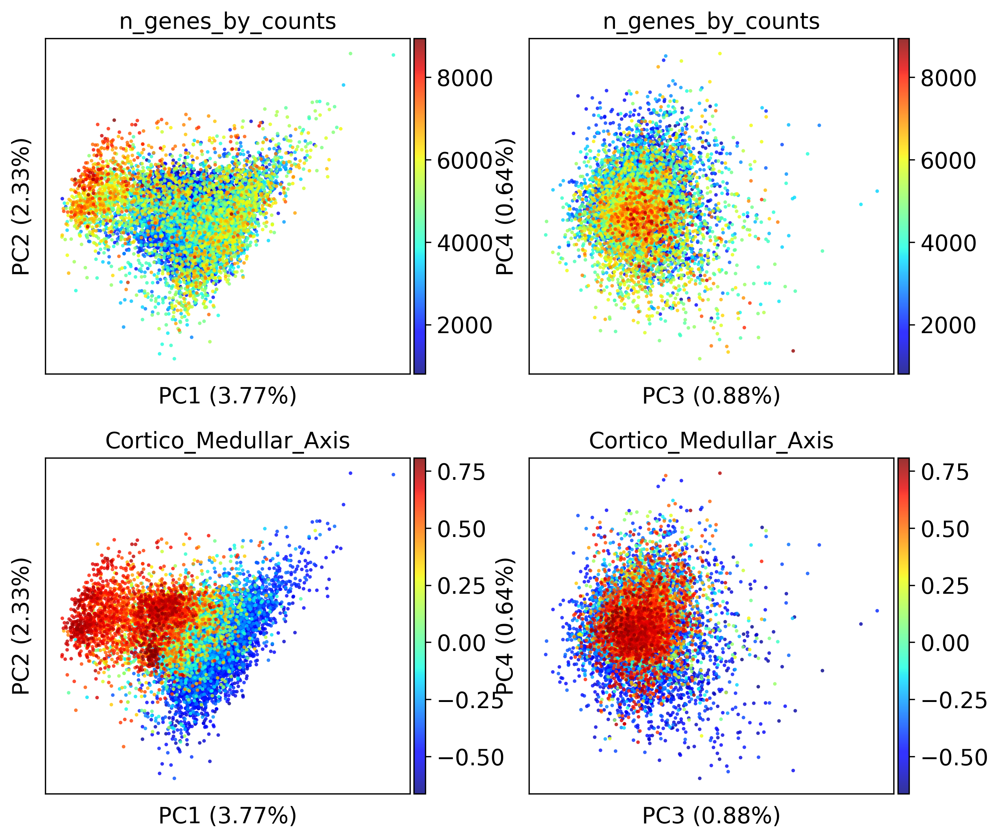

In [11]:
sc.pl.pca(adata_fet_cma, components = ['1,2', '3,4'], color = ['n_genes_by_counts', 'Cortico_Medullar_Axis'], ncols = 2, cmap = "jet",s=20,alpha=0.8,annotate_var_explained=True)

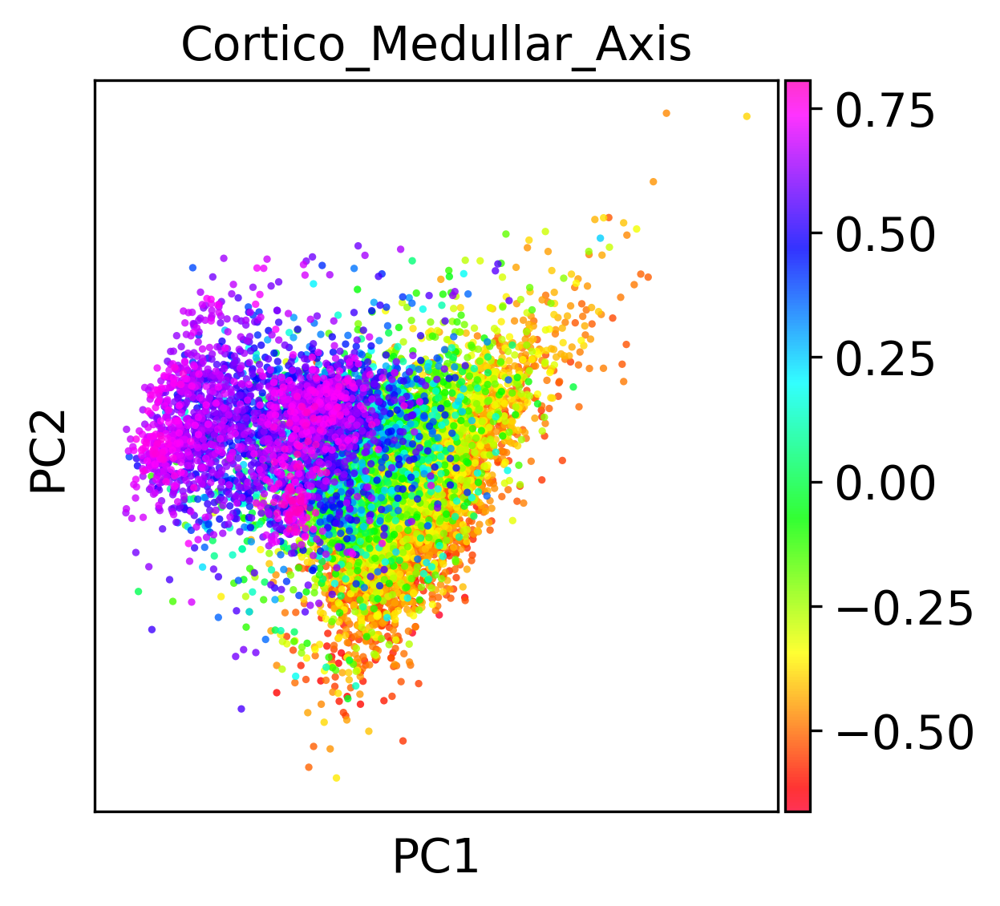

In [12]:
sc.pl.pca(adata_fet_cma, components = ['1,2'], color = [ 'Cortico_Medullar_Axis'], ncols = 2, cmap = "gist_rainbow",s=20,alpha=0.8,save='_fetal_CMA_v9.pdf')

In [13]:
pc_cor_vars = pd.DataFrame(index = ['PC'+ str(i+1) for i in range(0,50)], columns = ['Spearman (Genes by Counts)', 'pvalCount', 'Spearman (CMA)', 'pvalCMA'])

from scipy.stats import spearmanr
from matplotlib import pyplot
for i in range(0, 10):
    pcx = adata_fet_cma.obsm['X_pca'][:, i]
    pc_cor_vars.iloc[i, 0] = np.round(spearmanr(adata_fet_cma.obs['n_genes_by_counts'], pcx)[0],3)
    pc_cor_vars.iloc[i, 1] = np.round(spearmanr(adata_fet_cma.obs['n_genes_by_counts'], pcx)[1],3)
    pc_cor_vars.iloc[i, 2] = np.round(spearmanr(adata_fet_cma.obs['Cortico_Medullar_Axis'], pcx)[0],3)
    pc_cor_vars.iloc[i, 3] = np.round(spearmanr(adata_fet_cma.obs['Cortico_Medullar_Axis'], pcx)[1],3)

pc_cor_vars.iloc[0:4,[2,0]]

,Spearman (CMA),Spearman (Genes by Counts)
PC1,-0.658,-0.096
PC2,0.446,0.085
PC3,-0.022,-0.017
PC4,0.134,-0.175


# CMA marker genes

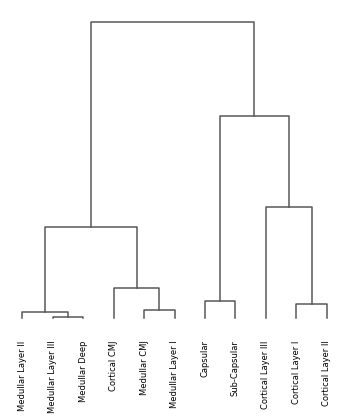

<AxesSubplot:>

In [61]:
sc.tl.dendrogram(adata_fet_cma, groupby='cma_bin_manual')
sc.pl.dendrogram(adata_fet_cma,groupby='cma_bin_manual')


In [70]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.tl.rank_genes_groups(adata_fet_cma, groupby='cma_bin_manual', method='t-test_overestim_var')

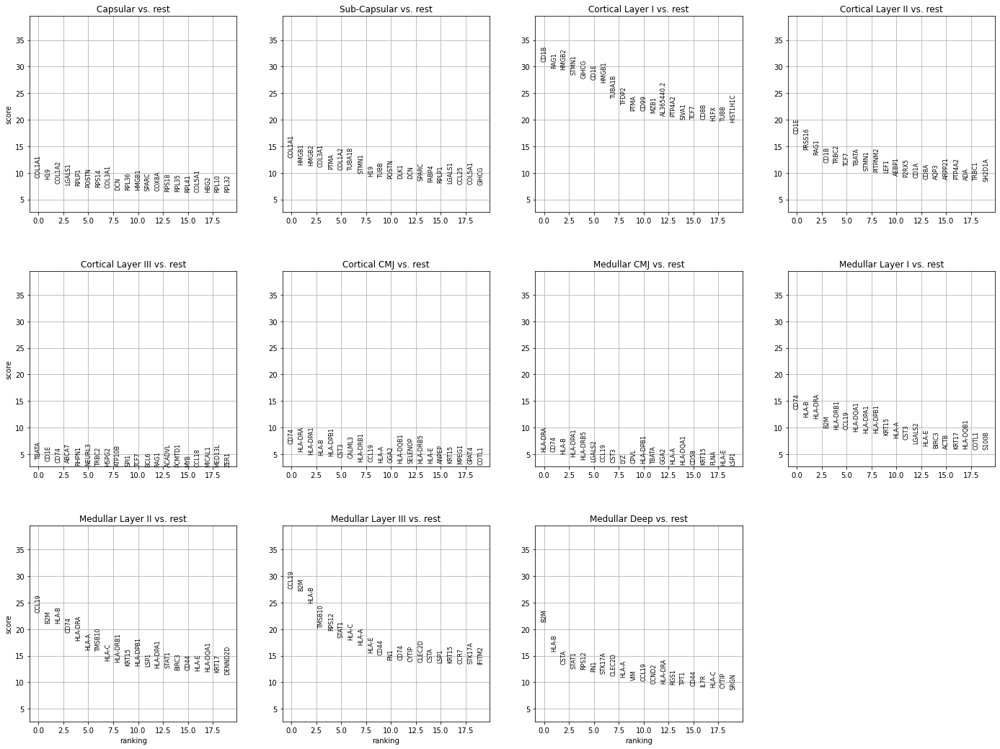

In [71]:
rcParams['figure.figsize'] = 6,6
rcParams['axes.grid'] = True
sc.pl.rank_genes_groups(adata_fet_cma)

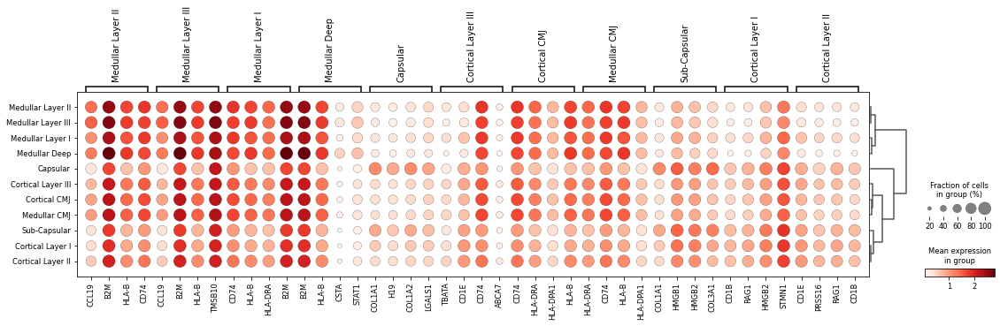

In [72]:
sc.pl.rank_genes_groups_dotplot(adata_fet_cma, n_genes=4,)

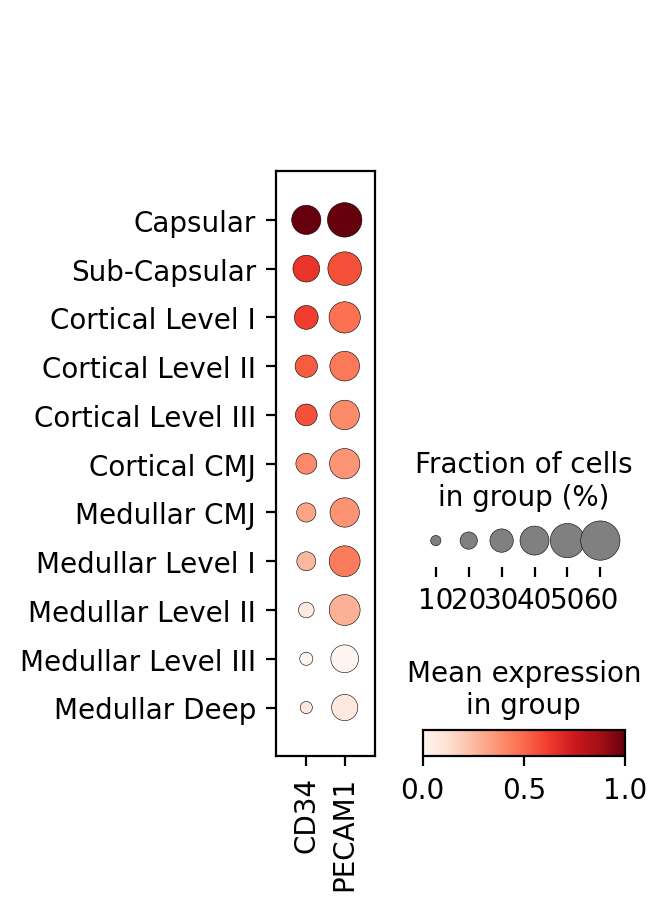

In [141]:
sc.pl.dotplot(adata_fet_cma,var_names=['CD34','PECAM1'],groupby='cma_bin_manual',cmap='Reds',expression_cutoff=0.1,standard_scale='var')

# Analyse cell level

In [24]:
celltypes = adata_fet_cma.uns['mod']['factor_names']
cellab_fet = sc.AnnData(adata_fet_cma.obs[celltypes], 
                         obs = adata_fet_cma.obs.drop(celltypes, axis = 1),obsm = adata_fet_cma.obsm)

cellab_fet.var_names
sc.pp.normalize_total(cellab_fet,target_sum=1000)


Index(['B(P)', 'B(Q)', 'B-pro/pre', 'DC-a1', 'DC-a3', 'DC1', 'DC2', 'EC-Art',
       'EC-Cap', 'EC-Cap-Prolif', 'EC-IFI44L', 'EC-Lympatic', 'EC-Ven',
       'EC-Ven-VCAN', 'ETP', 'InterloFb', 'InterloFb-COL9A3',
       'Macrophage-CD163', 'Macrophage-CD68', 'Mast', 'Monocyte', 'Neutrophil',
       'Pericyte', 'Pericyte_COL1A1', 'PeriloFb', 'PeriloFb-Prolif', 'RBC',
       'SMC', 'Schwann', 'TEC-cilliated', 'TEC-myo', 'TEC-neuro', 'T_CD4',
       'T_CD8', 'T_CD8-Prolif', 'T_CD8αα(I)', 'T_CD8αα(II)', 'T_CD8αα(entry)',
       'T_DN(CD4)', 'T_DN(P)', 'T_DN(Q)', 'T_DN(Q)-early', 'T_DN(early)',
       'T_DP(P)', 'T_DP(Q)', 'T_DP(Q)-CD99', 'T_NK', 'T_reg', 'T_reg(agonist)',
       'T_reg(diff)-FOXP3Lo', 'T_reg(diff)-FOXP3hi', 'T_αβT(entry)', 'T_γδT',
       'VSMC', 'VSMC_like', 'cTECI', 'cTECII', 'mTECI', 'mTECI-trans',
       'mTECII', 'mTECIII', 'mcTEC', 'mcTEC-Prolif', 'medFb', 'medFb-CCL21',
       'medFb-RGS5', 'nmSchwann', 'plasma-cells'],
      dtype='object')

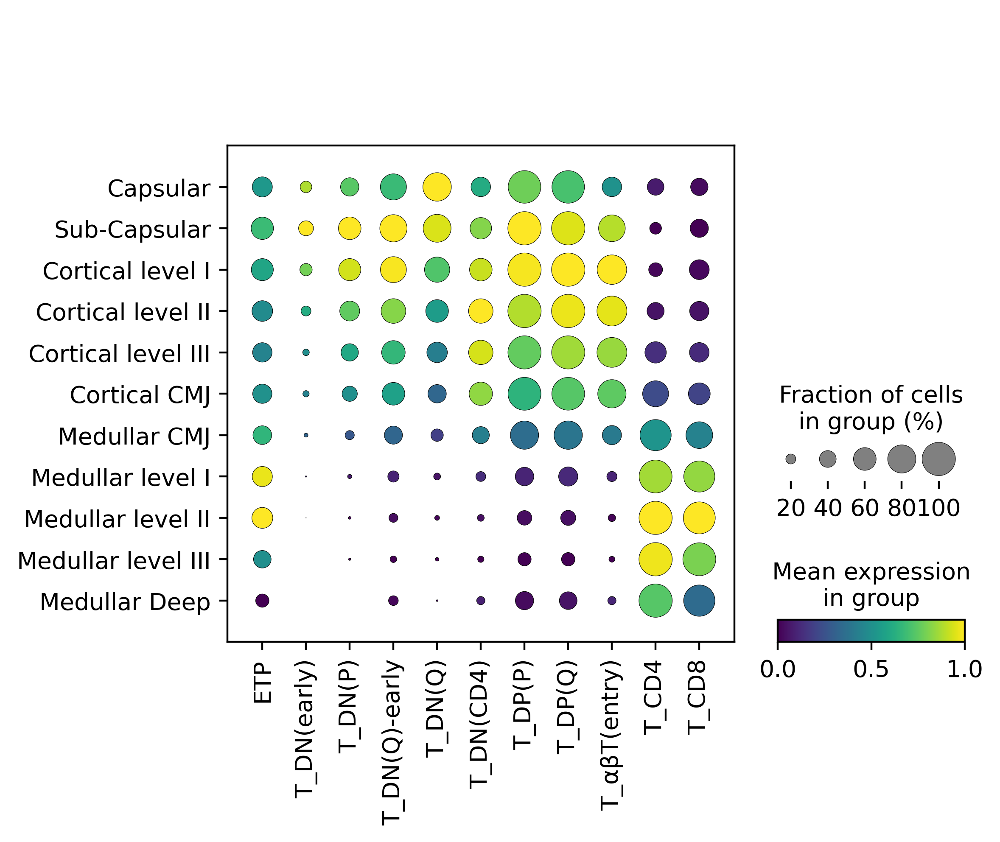

In [29]:
# cells = ['cTECII','cTECI','mcTEC-Prolif','mcTEC','mTECI','mTECII','mTECIII']
# cells = [ 'DC-a1', 'DC1', 'DC2','DC-a3']
# cells = ['T_reg(agonist)', 'T_reg(diff)-FOXP3Lo','T_reg(diff)-FOXP3hi','T_reg',]
# cells = ['B(P)', 'B(Q)', 'B-pro/pre']
# cells = ['PeriloFb','PeriloFb-Prolif','InterloFb', 'InterloFb-COL9A3', 'medFb-RGS5','medFb', 'medFb-CCL21']
cells = ['ETP','T_DN(early)','T_DN(P)','T_DN(Q)-early','T_DN(Q)','T_DN(CD4)', 'T_DP(P)','T_DP(Q)','T_αβT(entry)','T_CD4', 'T_CD8',]
# cells = []
# cells = ['EC-Art','EC-Cap', 'EC-Cap-Prolif', 'EC-IFI44L', 'EC-Ven','EC-Ven-VCAN','Pericyte', 'Pericyte_COL1A1']
# cells = ['TEC-myo', 'TEC-neuro', 'TEC-cilliated','mTECI-trans']
# cells = ['T_NK','T_γδT','T_CD8αα(entry)','T_CD8αα(I)','T_CD8αα(II)']
cutoff = 10
sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=200)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_fet,var_names=cells,
               groupby='manual_bin_cma_v2',cmap='viridis',standard_scale='var',expression_cutoff=cutoff)
              

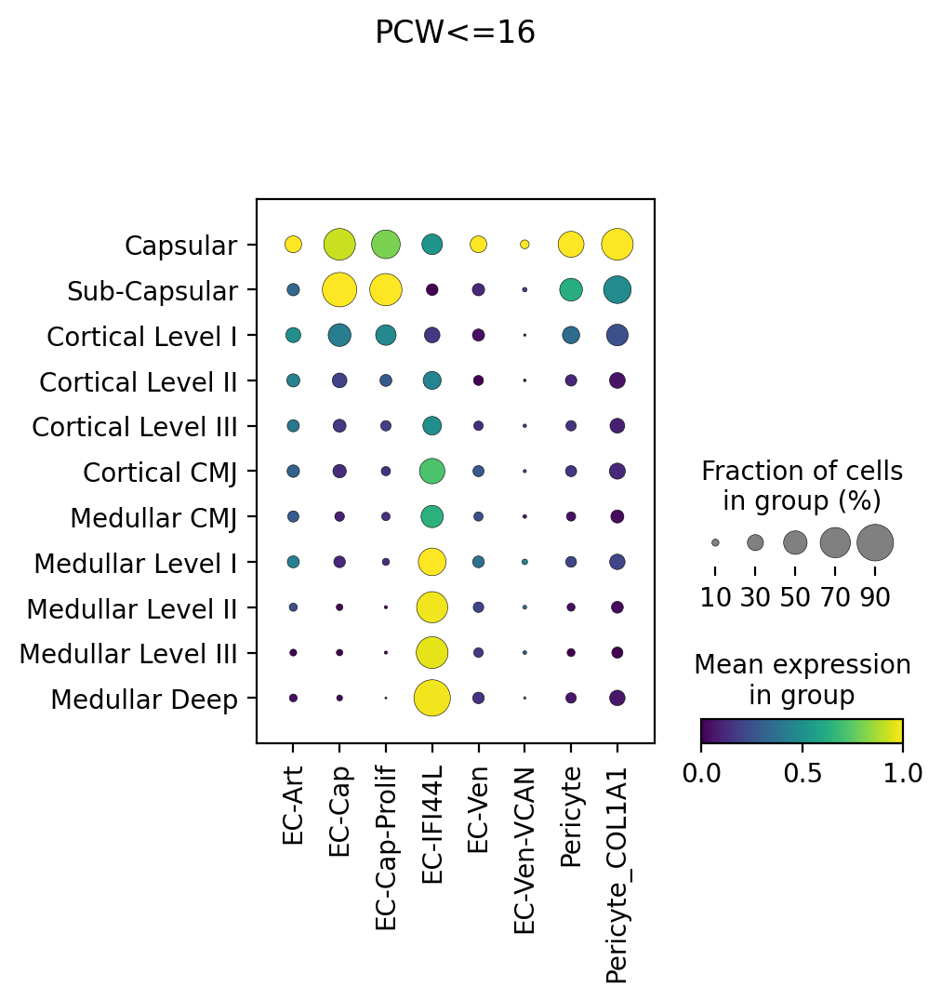

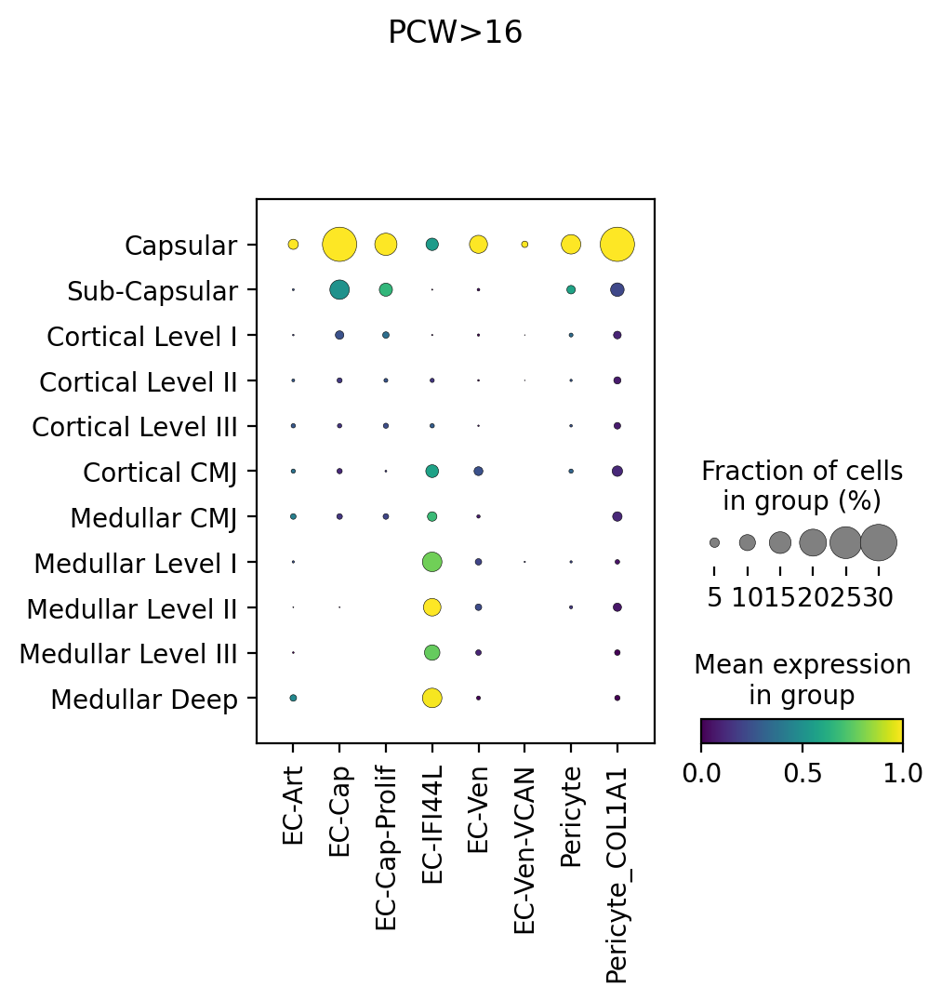

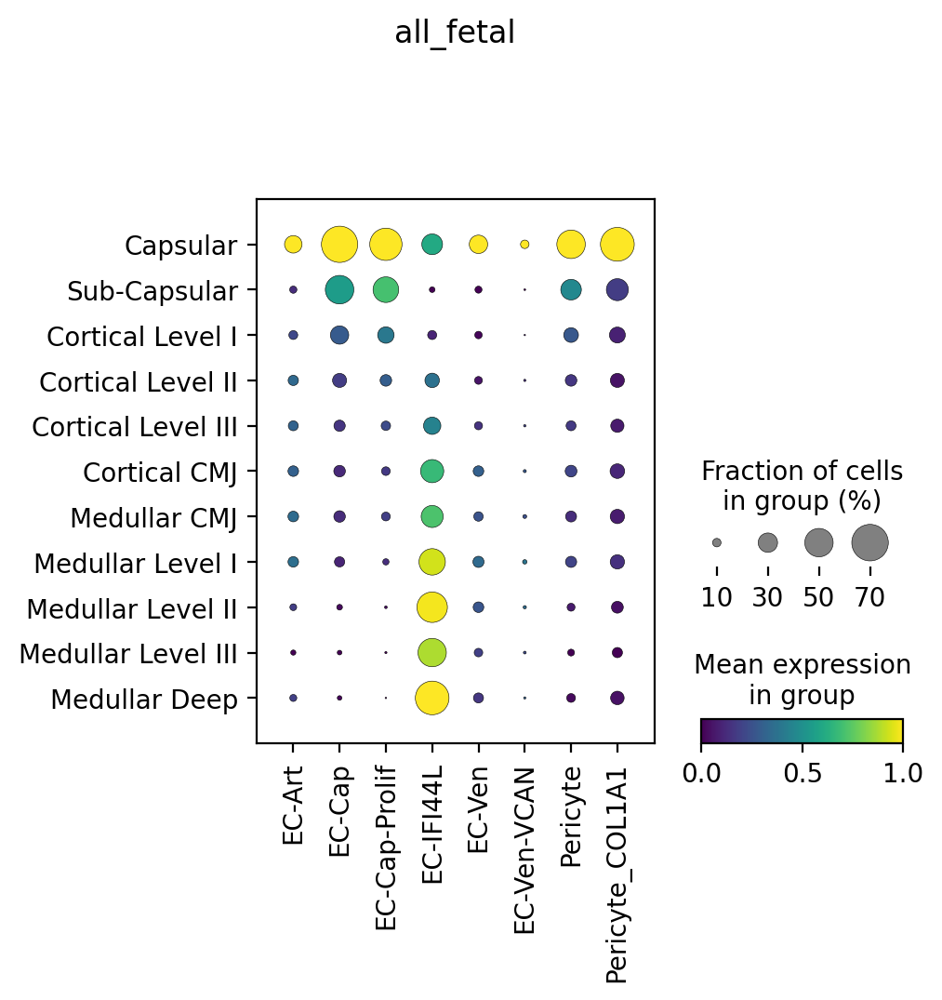

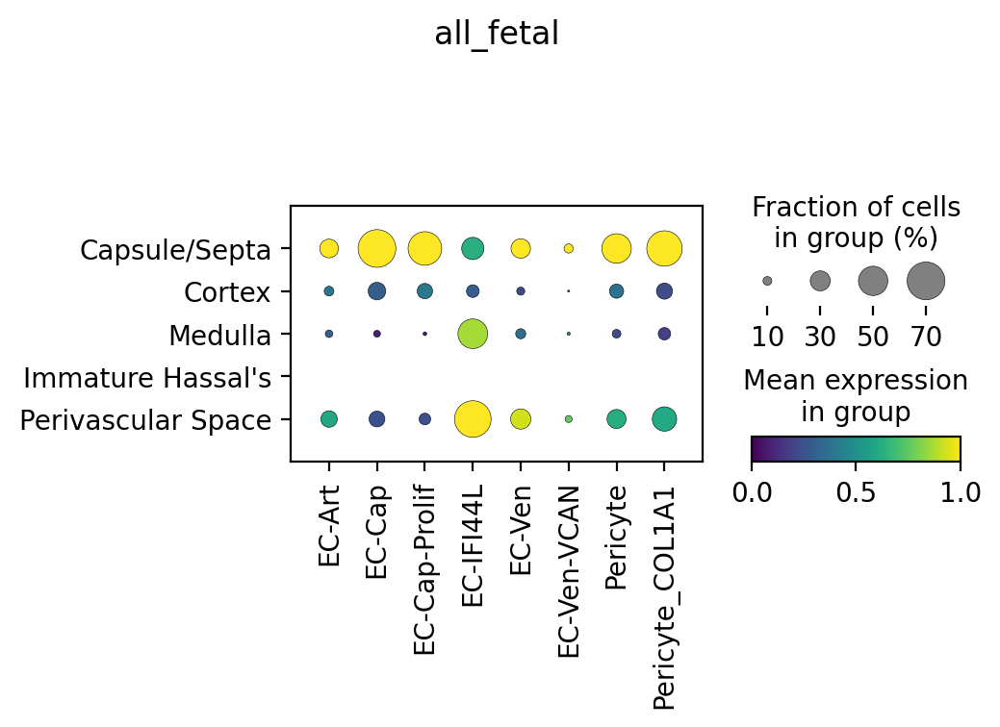

In [172]:
sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_fet[cellab_fet.obs['Age(numeric)']>-24],var_names=cells,
               groupby='cma_bin_manual',cmap='viridis',standard_scale='var',expression_cutoff=cutoff*3,save='fetal_c2l_pcw16plus.pdf',title='PCW>16')

sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_fet,var_names=cells,
               groupby='cma_bin_manual',cmap='viridis',standard_scale='var',expression_cutoff=cutoff,save='fetal_c2l_all.pdf',title='all_fetal')

sc.set_figure_params(figsize=[7,7],fontsize=12,dpi=100)
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure2')
sc.pl.dotplot(cellab_fet,var_names=cells,
               groupby='annotation_figure_1',cmap='viridis',standard_scale='var',expression_cutoff=cutoff,save='fetal_c2l_all_anno1.pdf',title='all_fetal')

# cluster analysis 

In [144]:
sc.tl.leiden(adata_fet_cma, resolution=2,key_added='leiden_2')
sc.pl.umap(adata_fet_cma, color = ['annotation_figure_1','leiden_2'],s=10, frameon = False, cmap = 'Reds',wspace=0.5,legend_loc='on data')


ValueError: You need to run `pp.neighbors` first to compute a neighborhood graph.

<Figure size 1800x1200 with 0 Axes>

<Figure size 1800x1200 with 0 Axes>

(0.0, 1.0, 0.0, 1.0)

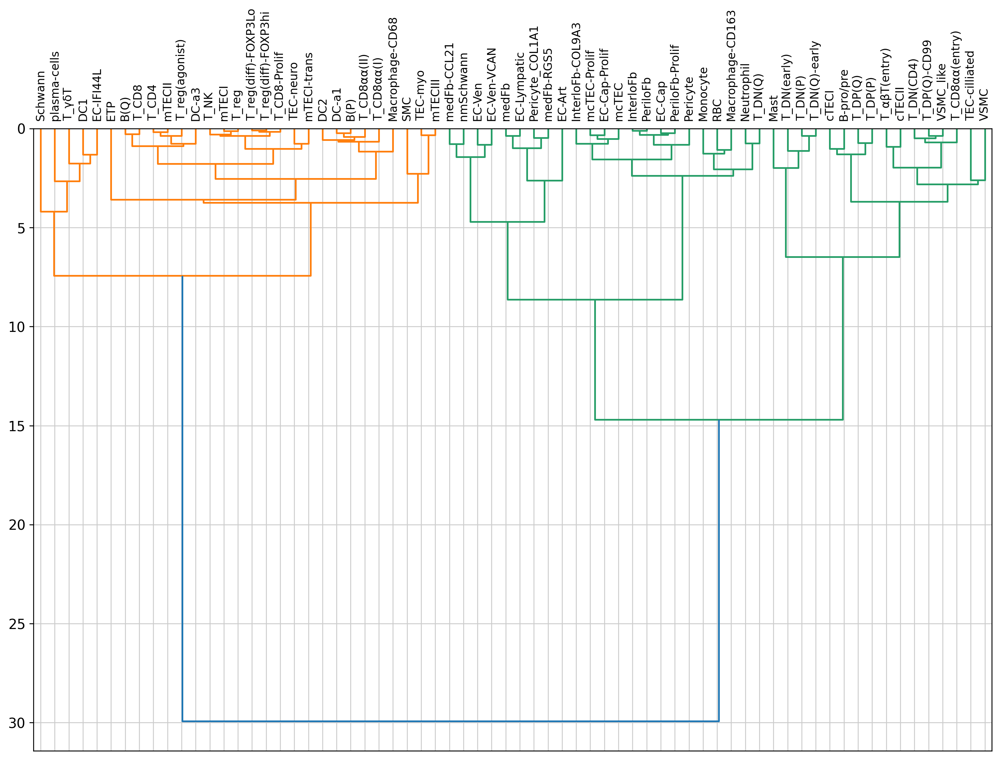

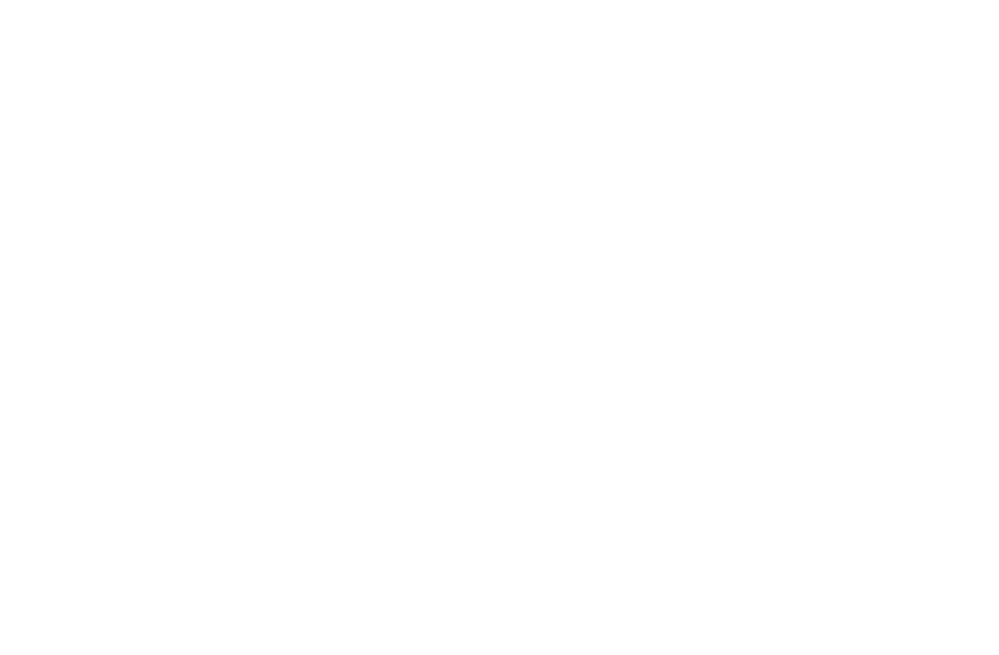

In [231]:
from scipy.cluster.hierarchy import dendrogram, linkage
celltypes = adata_fet_cma.uns['mod']['factor_names']
cellab_paed = sc.AnnData(adata_fet_cma.obs[celltypes], obs = adata_fet_cma.obs.drop(celltypes, axis = 1),obsm = adata_fet_cma.obsm)
df_full = pd.DataFrame(data=cellab_paed.X,columns=cellab_paed.var_names)
# df_full['leiden_2'] = cellab_paed.obs['leiden_2'].values
# df = df_full.groupby('leiden_2').mean()
df_full['cma_bin_manual'] = cellab_paed.obs['cma_bin_manual'].values
df = df_full.groupby('cma_bin_manual').mean()
from scipy.stats import entropy
df_entropy = df.apply(lambda x: entropy(x), axis = 0).sort_values()
from sklearn.preprocessing import MinMaxScaler,StandardScaler
# scaler = MinMaxScaler()
scaler = StandardScaler()

df_scaled = pd.DataFrame(scaler.fit_transform(df), 
                                  index = df.index, 
                                  columns = df.columns)
from scipy.cluster.hierarchy import dendrogram, linkage
linkage_data = linkage(df_scaled.T, optimal_ordering = True, method='ward', metric='euclidean')
plt.figure(figsize=(15,10), dpi=120)
dd = dendrogram(linkage_data, orientation="bottom",leaf_font_size=10,labels=df_scaled.columns)
plt.figure(figsize=(15,10), dpi=120)
# remove the grid lines
plt.grid(False)
# remove the axis labels
plt.axis('off')
#plt.show()
plt.savefig("Fetal_dd_ordering.pdf", bbox_inches='tight', transparent = True)